# Chekr cat - classification 
### Springboard Project

# 1. Data Preparation

### Problem Statement

The Smart Litter System is a smart cat litter system that is equipped with four load sensors capturing any load disturbance happening on the litter box. The device functions at 40 Hz frequency rate which means it records 40 samples per second. Multiple devices are used in the client facility to capture all activities in the device in the form of load signals on a day-to-day basis. The client facility is also equipped with cameras which capture photo feeds and video feeds that allows manual tagging of the various cat and human interaction events with the litter system.


#### Objective 
To develop a solution approach to correctly classify the events as elimination or non-elimination and further classify the elimination events into urination and defecation.

#### Data  Description:

●	Event Load Sensor Data: Event named load sensor data containing timesteps and Load Sensor values. 

●	Tags Data: Event named label/tag data containing the information about the event such as cat name, event tags, free text etc.		

In [2]:
#Importing Libraries

import os
from os.path import join, isfile
from os import path, scandir, listdir
import json
import glob

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import pprint as pp
from scipy import stats
import random
import statsmodels.api as sm
import statsmodels.stats.multicomp
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm

#supress the warnings
import warnings
warnings.filterwarnings('ignore')

In [3]:
data_dir = 'Raw_data'   #Folder name
sub_folders = os.listdir(data_dir)

### Tags Data 

In [4]:
#Extracting json files data in all sub-folders from tags Data

combined=[]

for i in sub_folders:
    path = os.path.join(data_dir,i)
    all_files = glob.glob(path + "/*.json")
    
    for json_file in all_files:
        with open(json_file, "rb") as infile:
            combined.append(json.load(infile))


In [5]:
df1 = pd.DataFrame(combined)
df1.head()

,Device_ID,Event_ID,Event_start_time,Tags,Free_text,Name_of_cat,Weight_of_cat,Tare_weight
0,VA00000000000017,RXZlbnRJbmZvcm1hdGlvbjo0OWQ4M2I3MS1kNDZmLTRiYj...,2020-09-05T10:56:11-05:00,"[urination, cat in box]",None,Ryan,6589,None
1,VA00000000000017,RXZlbnRJbmZvcm1hdGlvbjo0YmI3ZDc5YS0wNzMwLTQ0MT...,2020-07-18T14:41:37-05:00,"[cat in box, synapse_labeled, urination]","14:42:15\t14:43:09\tConfirmed activity, cat in...",Ryan,6935,None
2,VA00000000000017,RXZlbnRJbmZvcm1hdGlvbjo0ZTBhMDVhOC0wZmI2LTQ2MG...,2020-09-03T15:43:43-05:00,"[cat in box, urination]",None,Ryan,5139,None
3,VA00000000000017,RXZlbnRJbmZvcm1hdGlvbjo1NGEwMTg2My01NDhjLTRhYT...,2020-09-01T12:02:05-05:00,"[non_elimination, cat in box]",None,Ryan,6983,None
4,VA00000000000017,RXZlbnRJbmZvcm1hdGlvbjo1YzQwMzE4MS1lNzhkLTQ3Nz...,2020-08-08T06:47:11-05:00,"[cat in box, synapse_labeled, urination]","6:47:16\t6:48:59\tConfirmed activity, cat in t...",Ryan,7017,None


In [6]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13075 entries, 0 to 13074
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Device_ID         13075 non-null  object
 1   Event_ID          13075 non-null  object
 2   Event_start_time  13075 non-null  object
 3   Tags              13075 non-null  object
 4   Free_text         10648 non-null  object
 5   Name_of_cat       12829 non-null  object
 6   Weight_of_cat     13075 non-null  object
 7   Tare_weight       12063 non-null  object
dtypes: object(8)
memory usage: 817.3+ KB


In [7]:
#Splitting the column for date, time extraction seperately 

df1['Event_start_time']=df1['Event_start_time'].str.split('T')

In [8]:
date=[]
time=[]
for i in range(13075):
    d=df1['Event_start_time'][i][0]
    t=df1['Event_start_time'][i][1]
    date.append(d)
    time.append(t)
    
df1['Date']=date
df1['Event_start_time']=time

1. Different range of time is present over 24 hrs.
2. It is divided into bins to study the frequency of eliminations and its time zone 
3. Easy to identify during which timezone eliminations are more.

In [9]:
df1['Event_start_time']=df1['Event_start_time'].str.strip().str.split('-').str[0]
df1['Event_start_time'] = pd.to_datetime(df1['Event_start_time']).dt.time

In [10]:
hours = pd.to_datetime(df1['Event_start_time'], format='%H:%M:%S').dt.hour

df1['Time_bin'] = pd.cut(hours, bins=np.array([0,4,8,12,16,20,24]),include_lowest=True, labels=[0,1,2,3,4,5])
df1['Time_bin'].unique()

[2, 3, 1, 0, 4, 5]
Categories (6, int64): [0 < 1 < 2 < 3 < 4 < 5]

00:00 - 04:00 -> 0

04:00 - 08:00 -> 1

08:00 - 12:00 -> 2

12:00 - 16:00 -> 3

16:00 - 20:00 -> 4

20:00 - 00:00 -> 5

In [11]:
df1=df1.drop(['Event_start_time','Device_ID'],axis=1)

rows to be dropped in Tags data in Free text with tags such as merged,split,combine,no camera,review and trimmed.

 Reading the output variable from 'Tags' 

In [12]:
# checking the size in Tags colomn

for i in df1['Tags']:
    if len(i)>4:
        print(i)

In [13]:
for i in df1['Tags']:
    if 4-len(i)==1:
        i.append(0)
    elif 4-len(i)==2:
        i.append(0)
        i.append(0)
    elif 4-len(i)==3:
        i.append(0)
        i.append(0)
        i.append(0)

In [14]:
#classify elimination and its type from Tags colomn

list1=[]
for i in range(len(df1['Tags'])):
    for j in range(4):
        if df1['Tags'][i][j]=='urination':
            list1.append('u')
        elif df1['Tags'][i][j]=='defecation':
            list1.append('d')
        elif df1['Tags'][i][j]=='non_elimination':
            list1.append('ne')

list1.append('u')
list1.append('u')
list1.append('u')
df1['class']=list1

In [15]:
df1['in_box'] = np.nan
for i in range(13075):
    if 'cat in box' in df1['Tags'][i]:
        df1['in_box'][i] = True
    else:
        df1['in_box'][i] = False

In [16]:
df1['in_box'].value_counts()

True     13055
False       20
Name: in_box, dtype: int64

In [17]:
df1['labeled'] = np.nan
for i in range(13075):
    if 'synapse_labeled' in df1['Tags'][i]:
        df1['labeled'][i] = True
    else:
        df1['labeled'][i] = False

In [18]:
df1['labeled'].value_counts()

False    12832
True       243
Name: labeled, dtype: int64

In [19]:
# dropping columns which are not relevant

df1.drop(['Tags'],axis=1,inplace=True)

In [20]:
unwanted = ['merged','split','combine','no camera','review','trimmed']
remove=[]
f = df1[~df1['Free_text'].isna()]['Free_text']

for index,i in enumerate(f):
    for j in range(6):
        if unwanted[j] in f.iloc[index]:
            remove.append(index)  

### Behaviour Activities

In [21]:
df1['Free']=df1['Free_text']
df1['Free']=df1['Free'].str.split('\t')

#insertion of empty list inplace of none.

res=[]
for index, value in enumerate(df1['Free']):
    if value==None:
        df1['Free'][index]=res
               

In [22]:
activity=[]
for i in range(13075):
    if len(df1['Free'][i])==4:
        a=df1['Free'][i][3]
        a=a.split(',')[0]
        activity.append(a)
    else:
        activity.append(0)
        

df1['digging']=activity
df1['digging']=df1['digging'].str.strip().str.split('\n').str[0]

In [23]:
df_dummy=pd.get_dummies(data=df1['digging'], columns ='digging' )

In [24]:
df_dummy=df_dummy[['2 paws digging']]
df1.drop(['digging'],axis=1,inplace=True)
df_dummy

,2 paws digging
0,0
1,0
2,0
3,0
4,0
...,...
13070,0
13071,0
13072,0
13073,0


In [25]:
beh=[]
for i in range(13075):
    if len(df1['Free'][i])>4:
        b=df1['Free'][i][4]
        b=b.split(',')[0]
        beh.append(b)
    else:
        beh.append(0)
        

df1['activity']=beh      

In [26]:
df1['activity']=df1['activity'].str.strip().str.split('\n').str[0]

In [27]:
df_dummy[['Unit feet set to 5mm']]=(pd.get_dummies(data=df1['activity'], columns =
                                                 'activity' ))[['Unit feet set to 5mm']]

In [28]:
df1.drop(['activity'],axis=1,inplace=True)
df1=df1.join(df_dummy)

In [29]:
#column split and extracting time duration of activity

#df1['Free_text']=df1['Free_text'].str.split('\t')
df1['Free_text']=df1['Free_text'].str.split(',')

In [30]:
#insertion of empty list inplace of none.

res=[]
for index, value in enumerate(df1['Free_text']):
    if value==None:
        df1['Free_text'][index]=res
               

In [31]:
final=[]
for i in range(13075):
    if len(df1['Free_text'][i])>2:
        fin=df1['Free_text'][i][2:]
        final.append(fin)
    else:
        final.append(0)
        

df1['Free_text']=final

In [32]:
final=[]
for i in range(13075):
    if df1['Free_text'][i]!=0:
        fin=df1['Free_text'][i][0]
        fin=fin.replace('\n','\t').split()[0]
        final.append(fin.upper())
    else:
        final.append(0)
        

df1['final']=final

In [33]:
df1['final'].value_counts()

0                    4773
URINATION            4000
NON-ELIMINATION      2801
DEFECATION           1424
CAT                    59
ELIMINATION             3
2                       2
THEN                    2
JUMPED                  2
NON_ELIMINATION         1
NOT                     1
VOMIT                   1
NON                     1
COMBO                   1
NON-ELIMINATION6S       1
4                       1
SPLIT                   1
IN                      1
Name: final, dtype: int64

In [34]:
#df1['confirm']=df1['Free_text'].str.strip().str.split('\n').str[2:]

 Reading the output variable from 'Free_text' from confirmed activities

In [35]:
list1=[]
for i in range(len(df1['final'])):
    if df1['final'][i]=='URINATION':
        list1.append('u')
    elif df1['final'][i]=='DEFECATION':
        list1.append('d')
    elif df1['final'][i]=='NON-ELIMINATION':
        list1.append('ne')
    else:
        list1.append(0)
        
df1['final']=list1

In [36]:
# Replacing null entries with classes extracted from tags colomn

for index,i in enumerate(df1['final']):
    if i==0:
        df1['final'][index]=df1['class'][index]

In [37]:
# replacing empty rows with preceding name 

for index,i in enumerate(df1['Name_of_cat']):
    if pd.isnull(i):
        df1['Name_of_cat'][index]=df1['Name_of_cat'][index-1]

In [38]:
df1['Weight_of_cat']=df1['Weight_of_cat'].astype('int')
df1['class']=df1['class'].astype('category')
df1['Name_of_cat']=df1['Name_of_cat'].astype('category')

In [39]:
df1['2 paws digging']=df1['2 paws digging'].astype('category')
df1['Unit feet set to 5mm']=df1['Unit feet set to 5mm'].astype('category')

In [40]:
from datetime import datetime
df1['Date'] = pd.to_datetime(df1['Date'])
df1['Year'] = pd.to_datetime(df1['Date']).dt.year
df1['Month'] = pd.to_datetime(df1['Date']).dt.month
#df1['day'] = pd.to_datetime(df1['Date']).dt.day

In [41]:
df1['Age']=df1['Date']-df1.groupby(['Name_of_cat'])['Date'].transform('min')

In [42]:
df1['Age']=df1['Age'].dt.days

In [43]:
df1['Year']=df1['Year'].astype('category')
df1['Month']=df1['Month'].astype('category')

In [44]:
df1['Date'].nunique()

468

In [45]:
df1.head()

,Event_ID,Free_text,Name_of_cat,Weight_of_cat,Tare_weight,Date,Time_bin,class,in_box,labeled,Free,2 paws digging,Unit feet set to 5mm,final,Year,Month,Age
0,RXZlbnRJbmZvcm1hdGlvbjo0OWQ4M2I3MS1kNDZmLTRiYj...,0,Ryan,6589,None,2020-09-05,2,u,True,False,[],0,0,u,2020,9,59
1,RXZlbnRJbmZvcm1hdGlvbjo0YmI3ZDc5YS0wNzMwLTQ0MT...,[ urination],Ryan,6935,None,2020-07-18,3,u,True,True,"[14:42:15, 14:43:09, Confirmed activity, cat i...",0,0,u,2020,7,10
2,RXZlbnRJbmZvcm1hdGlvbjo0ZTBhMDVhOC0wZmI2LTQ2MG...,0,Ryan,5139,None,2020-09-03,3,u,True,False,[],0,0,u,2020,9,57
3,RXZlbnRJbmZvcm1hdGlvbjo1NGEwMTg2My01NDhjLTRhYT...,0,Ryan,6983,None,2020-09-01,2,ne,True,False,[],0,0,ne,2020,9,55
4,RXZlbnRJbmZvcm1hdGlvbjo1YzQwMzE4MS1lNzhkLTQ3Nz...,[ urination],Ryan,7017,None,2020-08-08,1,u,True,True,"[6:47:16, 6:48:59, Confirmed activity, cat in ...",0,0,u,2020,8,31


In [46]:
df1.drop(['Free_text','Date','Tare_weight','Free'],axis=1,inplace=True)

## Sensor Data

Given Sensor data in form of csv files has load sensor data,sum of data, timestamp(recorded with frequency rate of 40 Hz). 13075 csv files are present each file containing around 6000 entries. This data is minimised to the size equivalent to json file by extracting statistical measures of each file.

In [47]:
from scipy import pi
from scipy.fftpack import fft,fftfreq
from statistics import mode

In [48]:
# extracting all csv files from the above given path
# extracting the required features by minimising the data


d={'Event_ID':[],'lco_mean':[],'lc1_mean':[],'lc2_mean':[],'lc3_mean':[],'lc1_var':[],'lc0_p2p':[],
   'lc1_p2p':[],'lc2_p2p':[],'lc3_p2p':[],'max':[],'median':[],'std':[],'mean':[],'Difference':[],
   'timestamp':[],'Power':[],'mad':[],'max_roc':[],'P2p':[],'FormFactor':[],'PulseIndicator':[],
   'Energy':[],'Skew':[],'Kurtosis':[],'Sum_f':[],'Var_f':[]}

for i in sub_folders:
    path = os.path.join(data_dir,i)
    
    all_filenames = glob.glob(path + '/*.csv')
    
    
    for f in all_filenames:
        
        temp_df= pd.read_csv(f)
        temp_df.drop(['t'],axis=1,inplace=True)
        temp_df[temp_df<0] = 0
        temp_df['sum']=temp_df.iloc[:,0:4].sum(axis=1)
        d['Event_ID'].append(f.split('\\')[2].split('.')[0])
        
        X=temp_df[['sum']]
        t=temp_df[['timestamp']]
        roc=temp_df.pct_change().max()
        
        
        d['lco_mean'].extend(temp_df[['lc0']].mean())
        d['lc1_mean'].extend(temp_df[['lc1']].mean())
        d['lc2_mean'].extend(temp_df[['lc2']].mean())
        d['lc3_mean'].extend(temp_df[['lc3']].mean())
        d['lc1_var'].extend(temp_df[['lc1']].var())

        d['lc0_p2p'].extend(np.ptp(temp_df[['lc0']]))
        d['lc1_p2p'].extend(np.ptp(temp_df[['lc1']]))
        d['lc2_p2p'].extend(np.ptp(temp_df[['lc2']]))
        d['lc3_p2p'].extend(np.ptp(temp_df[['lc3']]))
        
        # timedomain
        d['timestamp'].extend(t.iloc[-1])
        d['max'].extend(X.max())
        d['mean'].extend(X.mean())
        d['median'].extend(X.median())
        d['std'].extend(X.std())
        d['Difference'].extend(X.iloc[0]-X.iloc[-1])
        d['Power'].append(np.mean(X**2))
        d['P2p'].append(np.ptp(X))
        d['Skew'].append(stats.skew(X))
        d['Kurtosis'].append(stats.kurtosis(X))
        d['max_roc'].append(roc['sum'])
        # median abs dev 
        d['mad'].append(np.median(np.absolute(X-np.median(X))))
        # energy
        d['Energy'].append(np.sum(X**2))
        
        d['FormFactor'].append(np.sqrt(np.mean(X**2))/np.mean(X))
        d['PulseIndicator'].append(np.max(np.abs(X))/np.mean(X))    
       
         ## FREQ DOMAIN ##
        ft = fft(X)
        S = np.abs(ft**2)/13075
        d['Sum_f'].append(np.sum(S))
        d['Var_f'].append(np.var(S))
        
df=pd.DataFrame(d)

KeyboardInterrupt: 

In [ ]:
df.info()

In [ ]:
df['Power']=df['Power'].astype(int)
df['Skew']=df['Skew'].astype(float)
df['Kurtosis']=df['Kurtosis'].astype(float)
df['Energy']=df['Energy'].astype(float)
df['FormFactor']=df['FormFactor'].astype(float)
df['PulseIndicator']=df['PulseIndicator'].astype(float)
df['P2p']=df['P2p'].astype(float)

In [ ]:
df['Energy']=df['Energy']/df['timestamp']

In [ ]:
df=df.round(3)

In [ ]:
#final dataset

dff=df1.merge(df,on='Event_ID',how ='inner')
dff

In [ ]:
plt.figure(figsize=(20,15))
sns.heatmap(dff.corr(), cmap="YlGnBu", annot=True)

dropping highly correlated variables

In [ ]:
cor_matrix = dff.corr().abs()
upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape),k=1).astype(np.bool))
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.8)]
print(to_drop)

In [ ]:
dff_o=dff.drop(to_drop,axis=1)

In [ ]:
mapping = {'ne':0,'u':1,'d':2}
dff_o['class'] = dff_o['final'].replace(mapping)

In [ ]:
dff_o.corr()["class"]

In [ ]:
dff_o.drop(remove,axis=0,inplace=True)

# tags data after ignoring above mentioned events

In [ ]:
dff_o=dff_o.reset_index()

dff_o.shape

In [ ]:
dff_o.drop(['Event_ID'],axis=1,inplace=True)

In [73]:
dff.describe()

,Weight_of_cat,Age,lco_mean,lc1_mean,lc2_mean,lc3_mean,lc1_var,lc0_p2p,lc1_p2p,lc2_p2p,...,mad,max_roc,P2p,FormFactor,PulseIndicator,Energy,Skew,Kurtosis,Sum_f,Var_f
count,13075.000000,13075.000000,13075.000000,13075.000000,13075.000000,13075.000000,1.307500e+04,13075.000000,13075.000000,13075.000000,...,13075.000000,13075.000000,13075.000000,13075.000000,13075.000000,1.307500e+04,13075.000000,13075.000000,1.307500e+04,1.307500e+04
mean,4808.845889,185.597859,2956.994930,2745.668099,3027.631018,3061.381952,5.883133e+05,2739.255220,2945.722830,2880.964359,...,278.043059,0.081738,6053.956252,1.019052,1.338081,6.212467e+09,-0.050118,0.895291,5.533278e+07,1.538481e+07
std,999.232091,130.250268,1905.479944,1572.255357,1773.595551,1767.521211,6.628335e+05,1209.019012,1254.896328,1292.290343,...,539.699424,0.166372,1813.812454,0.017506,0.258937,3.496539e+09,1.602736,17.488518,4.832245e+07,1.338240e+07
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,...,0.500000,0.001000,15.000000,1.000000,1.003000,8.302519e+07,-7.061000,-1.996000,3.162989e+05,2.130000e+00
25%,4177.000000,82.000000,1559.213500,1596.860000,1702.355500,1811.992500,1.895801e+05,1994.500000,2138.000000,2078.000000,...,8.000000,0.042000,5004.000000,1.009000,1.193000,3.749323e+09,-0.817000,-1.836000,2.308782e+07,6.320191e+06
50%,4651.000000,160.000000,2740.203000,2653.113000,3014.793000,2949.027000,4.248458e+05,2709.000000,2893.000000,2844.000000,...,60.000000,0.061000,5854.000000,1.015000,1.288000,5.442015e+09,-0.046000,-1.436000,4.229818e+07,1.150222e+07
75%,5500.000000,292.000000,4151.684500,3789.785000,4319.234000,4161.053500,7.659288e+05,3433.000000,3654.500000,3612.500000,...,240.250000,0.090000,6659.000000,1.024000,1.408000,7.729814e+09,0.544000,0.139000,7.227620e+07,2.000514e+07
max,21875.000000,463.000000,10269.141000,9350.249000,9418.640000,11122.372000,8.656589e+06,14938.000000,13704.000000,25706.000000,...,3792.500000,11.338000,39916.000000,1.323000,9.294000,2.098965e+10,27.568000,875.605000,7.833373e+08,1.099335e+08


In [262]:
dff.dropna(inplace=True)

Factor that impacts the amount of data needed in different projects have different levels of tolerance for errors. 

The most common way to define whether a data set is sufficient is to apply a 10 times rule. This rule means that the amount of input data (i.e., the number of examples) should be ten times more than the number of degrees of freedom a model has. Usually, degrees of freedom mean parameters in your data set.

The shape of total data is 13015*36 which is sufficient to build a model.

# 2. Data Analysis and Hypothesis Testing

In [41]:
dff['final'].value_counts()

u     6480
ne    4270
d     2325
Name: final, dtype: int64

In [42]:
dff['Time_bin'].value_counts()

1    2953
2    2742
3    2584
0    2336
4    1422
5    1038
Name: Time_bin, dtype: int64

In [44]:
dff.groupby(['final']).mean()

,index,Weight_of_cat,Age,lco_mean,lc1_mean,lc2_mean,lc3_mean,lc1_var,lc0_p2p,lc1_p2p,...,Power,mad,max_roc,P2p,FormFactor,PulseIndicator,Skew,Kurtosis,Sum_f,Var_f
final,,,,,,,,,,,,,,,,,,,,,
d,6064.511015,4843.591361,187.730886,2993.953887,2933.376471,3274.249315,3253.341613,574449.792953,3010.085097,3159.295464,...,1.713565e+08,346.823326,0.090257,6138.099784,1.016732,1.270004,-0.791586,0.584448,8.362339e+07,1.544751e+07
ne,7429.692561,4768.560264,204.240819,2817.507395,2621.589206,2705.332884,3015.417301,583285.805945,2544.994350,2845.816149,...,1.387264e+08,275.914313,0.089376,6051.569444,1.019116,1.402744,0.496623,3.269903,3.848651e+07,1.274999e+07
u,6141.799597,4821.409175,172.818971,3034.369488,2762.165675,3150.355675,3024.120380,596721.393006,2768.670645,2935.046962,...,1.604446e+08,255.195986,0.073588,6021.249225,1.019800,1.319447,-0.145743,-0.541239,5.628468e+07,1.707050e+07


## Univariate Analysis

<AxesSubplot:xlabel='Time_bin', ylabel='count'>

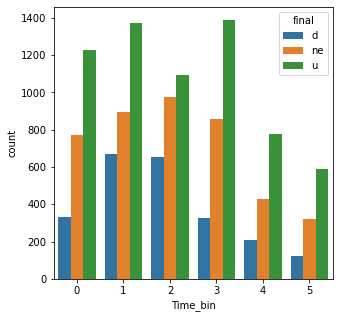

In [156]:
plt.figure(figsize=(5, 5))
sns.countplot(x='Time_bin',data=dff,hue='final')

<AxesSubplot:xlabel='Month', ylabel='count'>

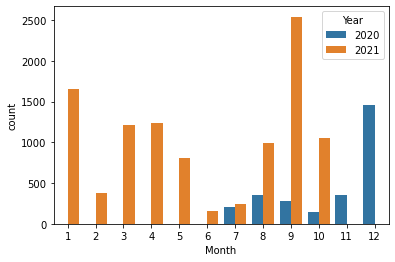

In [87]:
sns.countplot(x='Month',hue='Year',data=dff)

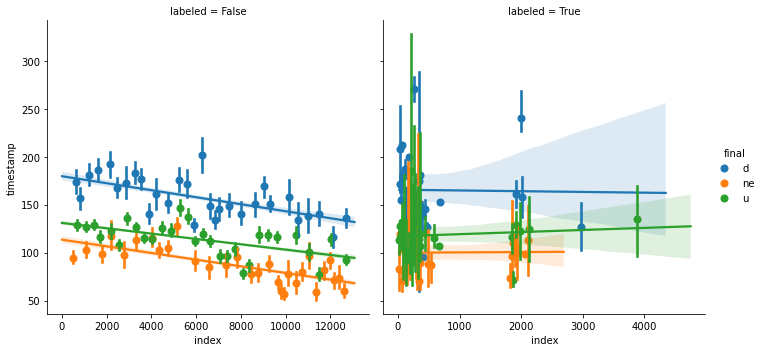

In [52]:
sns.lmplot(data=dff,x='index',y='timestamp',hue='final',col='labeled',sharex=False,x_bins=30)

Above plot depicting the duration of activites.

Defecation is taking maximum time followed by urination and non_elimination 

In [268]:
num_cols = list(dff_o.select_dtypes([np.number]).columns)
num_cols.remove('class')

In [270]:
len(num_cols)

25

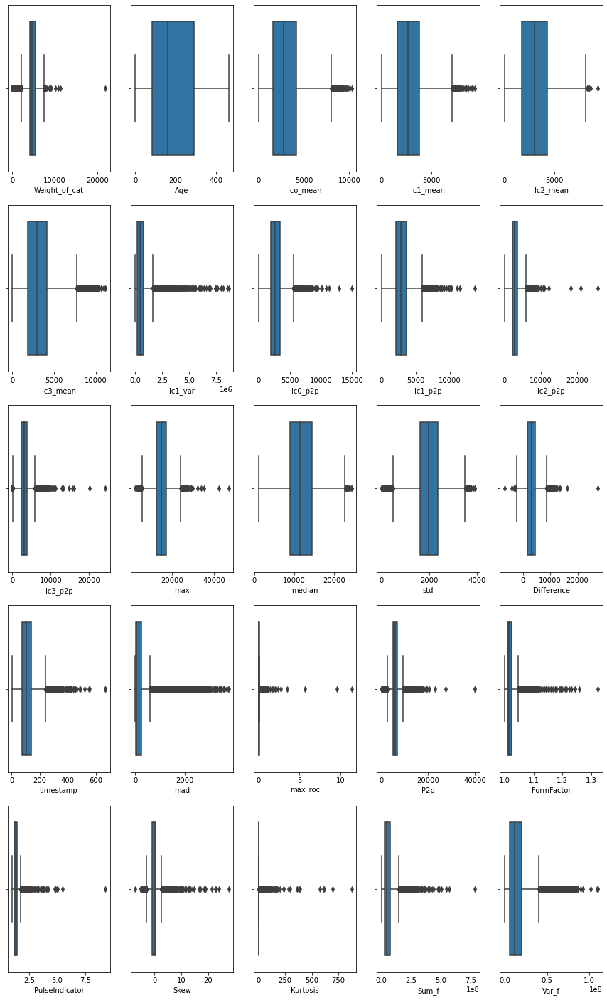

In [271]:
fig, axes = plt.subplots(nrows=5,ncols=5,figsize=(15, 25), sharey=True)

for i,ax in zip(num_cols,axes.flat):
    sns.boxplot(x=i,data=dff,ax=ax)
    

long tails from above plot represents outliers in the columns which are to be treated.

In [74]:
#Outlier Analysis

def iqr(x):
    IQR = np.diff(x.quantile([0.3,0.7]))[0]
    Q1 = x.quantile(0.3)
    Q3 = x.quantile(0.7)
    S = 1.5*IQR
    x[x < Q1-S] =x.median()
    x[x >Q3+S] = Q3+S
    return x

In [75]:
iqr(dff_o['Weight_of_cat'])

0        6589.0
1        6935.0
2        5139.0
3        6983.0
4        7007.7
          ...  
13010    4116.0
13011    4604.0
13012    4416.0
13013    4386.0
13014    4510.0
Name: Weight_of_cat, Length: 13015, dtype: float64

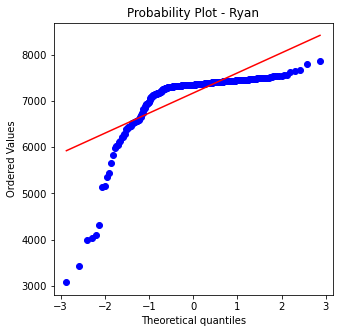

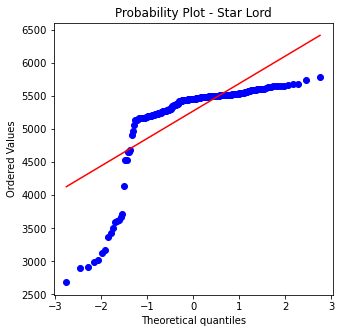

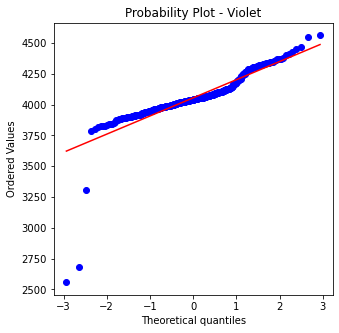

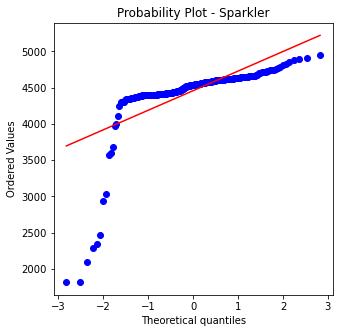

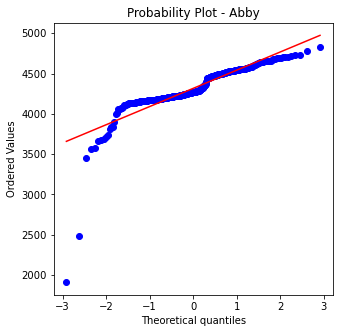

...

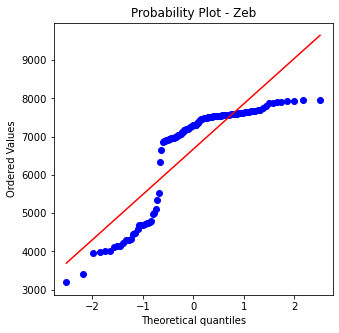

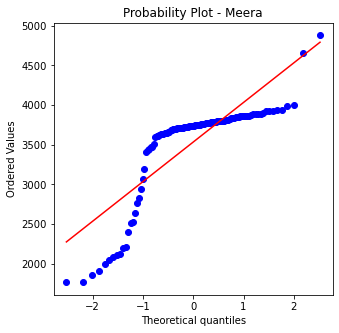

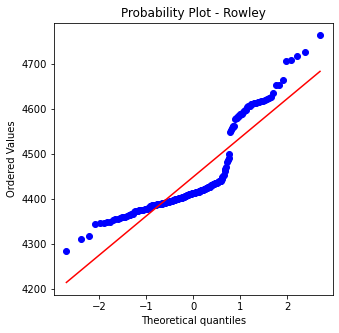

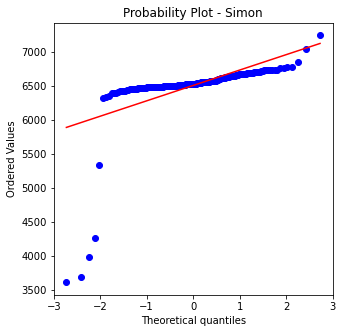

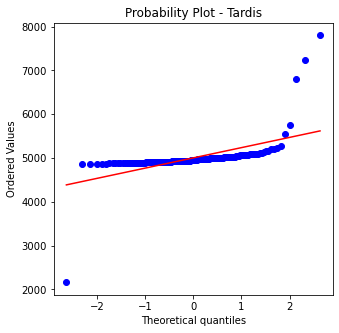

In [67]:
names=dff['Name_of_cat'].unique()

for i in names:
    plt.rcParams['figure.figsize']=(5,5)
    stats.probplot(dff_o[dff_o['Name_of_cat'] == i]['Weight_of_cat'],plot=plt)
    plt.title("Probability Plot - " +  i)
    plt.show()

In [139]:
stats.shapiro(dff['Weight_of_cat'])

ShapiroResult(statistic=0.9734666347503662, pvalue=1.8637269575520067e-43)

p-value< 0.05 then we reject the null hypothesis i.e. sample does not come from a normal distribution.

Above plots depict the weight distribution of each cat in the data. Most of the cat's weight is following normal distribution but as a whole the distribution is distorted with multiple peaks.

For normal distribution of data one-way ANOVA is considered a robust test. It can tolerate data that is non-normal (skewed or kurtotic distributions) with only a small effect on the Type I error rate.

If data is non-normal, data can be

● transformed using log or boxcox to get normally distributed data or 

● choose the non-parametric Kruskal-Wallis Test which does not require the assumption of normality.

In [59]:
dff[dff['Kurtosis']>13]['final'].value_counts()

ne    208
u      37
d      36
Name: final, dtype: int64

In [192]:
dff.groupby(['final']).agg({'Power':'median'})

,Power
final,
d,151431871.0
ne,127118100.5
u,137365444.0


In [333]:
def anova_test(data, variable):
    
    x = ['Weight_of_cat','std','timestamp','Power','max_roc','Skew','mad','P2p']
    for i,k in enumerate(x):
        lm = ols('{} ~ {}'.format(x[i],variable), data=data).fit()
        table = sm.stats.anova_lm(lm)
        print("P-value for 1-way ANOVA test between {} and {} is ".format(x[i],variable),
              table.loc[variable,'PR(>F)'])

In [334]:
anova_test(dff,'final')

P-value for 1-way ANOVA test between Weight_of_cat and final is  0.0047365124397310285
P-value for 1-way ANOVA test between std and final is  3.2374430477851415e-74
P-value for 1-way ANOVA test between timestamp and final is  0.0
P-value for 1-way ANOVA test between Power and final is  4.010075604855049e-56
P-value for 1-way ANOVA test between max_roc and final is  2.4931909788745904e-07
P-value for 1-way ANOVA test between Skew and final is  4.882371279285992e-229
P-value for 1-way ANOVA test between mad and final is  2.0195175327875646e-11
P-value for 1-way ANOVA test between P2p and final is  0.029312739645972783


p_value>0.05 for weight of cat i.e failed to reject null hypothesis may have similar weights in all activities

Checking the same with kruskal wallis test as it is not following normal distribution

In [61]:
import pingouin as pg

pg.kruskal(dv='Weight_of_cat', between='final', data=dff)

,Source,ddof1,H,p-unc
Kruskal,final,2,1.111243,0.573715


Dunn’s Multiple Comparison Test is a non-parametric post hoc, non-parametric test that doesn’t presume your data comes from a certain distribution.It is used to determine which particular means are different from the rest. 

In [143]:
import scikit_posthocs as sp

data=[dff[dff['final']=='u']['Weight_of_cat'],dff[dff['final']=='d']['timestamp'],
      dff[dff['final']=='ne']['Weight_of_cat']]

tukey = sp.posthoc_dunn(data,p_adjust = 'holm')
print(tukey)

          1    2         3
1  1.000000  0.0  0.706486
2  0.000000  1.0  0.000000
3  0.706486  0.0  1.000000


Bartlett’s test to see if the variances in each group are equal.

In [144]:
g_u=dff[dff['final']=='u']['Weight_of_cat']
g_d=dff[dff['final']=='d']['Weight_of_cat']
g_ne=dff[dff['final']=='ne']['Weight_of_cat']

stats.bartlett(g_u,g_d,g_ne)

BartlettResult(statistic=32.25113901881313, pvalue=9.925540013817928e-08)

p-value < 0.05, null hypothesis is rejected or all groups donot have the same variance.

In [145]:
pg.welch_anova(dv='Weight_of_cat', between='final', data=dff)

,Source,ddof1,ddof2,F,p-unc,np2
0,final,2,6144.067967,0.270633,0.762906,0.000039


In [146]:
pg.kruskal(dv='std', between='final', data=dff)

,Source,ddof1,H,p-unc
Kruskal,final,2,263.680342,5.527658e-58


In [147]:
pg.kruskal(dv='timestamp',between='final', data=dff)

,Source,ddof1,H,p-unc
Kruskal,final,2,2636.922108,0.0


In [148]:
pg.kruskal(dv='max_roc',between='final',data=dff)

,Source,ddof1,H,p-unc
Kruskal,final,2,265.277669,2.487059e-58


In [74]:
pg.kruskal(dv='Sum_f', between='final', data=dff)

,Source,ddof1,H,p-unc
Kruskal,final,2,1893.112469,0.0


As most of the data is not normally distributed data wrt activities are checked with ANOVA and kruskal wallis test showing the similar results i.e., distribution is different for among activities

In [ ]:
pg.kruskal(dv='Sum_f', between='final', data=dff)

In [55]:
tukey = pairwise_tukeyhsd(endog=dff['Skew'], groups=dff['Time_bin'], alpha=0.05)
print(tukey)

Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     0      1   0.2471    0.0  0.1514  0.3427   True
     0      2   0.1961    0.0  0.0986  0.2935   True
     0      3   0.3653    0.0  0.2666   0.464   True
     0      4   0.1571 0.0016  0.0409  0.2733   True
     0      5    0.142 0.0202  0.0136  0.2704   True
     1      2   -0.051 0.6094 -0.1428  0.0408  False
     1      3   0.1182  0.004  0.0251  0.2114   True
     1      4    -0.09 0.1937 -0.2014  0.0215  False
     1      5  -0.1051 0.1521 -0.2292  0.0191  False
     2      3   0.1692    0.0  0.0742  0.2642   True
     2      4   -0.039 0.9236  -0.152   0.074  False
     2      5  -0.0541 0.8237 -0.1796  0.0715  False
     3      4  -0.2082    0.0 -0.3223 -0.0941   True
     3      5  -0.2233    0.0 -0.3498 -0.0967   True
     4      5  -0.0151 0.9996 -0.1557  0.1255  False
----------------------------------------------

###  Activity wrt Raw data

In [118]:
df_each=pd.DataFrame()
file=[]

for i in sub_folders:
    path = os.path.join(data_dir,i)
    
    all_filenames = glob.glob(path + '/*.csv')
    
    
    for f in all_filenames:
        file.append(f.split('\\')[2])
        
df_each['file']=file

In [137]:
df_raw=df1[['Device_ID','final','labeled']].join(df_each)
df_raw

,Device_ID,final,labeled,file
0,VA00000000000017,u,False,RXZlbnRJbmZvcm1hdGlvbjo0OWQ4M2I3MS1kNDZmLTRiYj...
1,VA00000000000017,u,True,RXZlbnRJbmZvcm1hdGlvbjo0YmI3ZDc5YS0wNzMwLTQ0MT...
2,VA00000000000017,u,False,RXZlbnRJbmZvcm1hdGlvbjo0ZTBhMDVhOC0wZmI2LTQ2MG...
3,VA00000000000017,ne,False,RXZlbnRJbmZvcm1hdGlvbjo1NGEwMTg2My01NDhjLTRhYT...
4,VA00000000000017,u,True,RXZlbnRJbmZvcm1hdGlvbjo1YzQwMzE4MS1lNzhkLTQ3Nz...
...,...,...,...,...
13070,VB00000000000192,u,False,RXZlbnRJbmZvcm1hdGlvbjplOTY1YzllOC01YWU1LTRmYj...
13071,VB00000000000192,u,False,RXZlbnRJbmZvcm1hdGlvbjpmNDMxM2YwNi1hNzk0LTQxMG...
13072,VB00000000000192,u,False,RXZlbnRJbmZvcm1hdGlvbjpmYjQ3YzJkZi03ODY3LTQ3Zm...
13073,VB00000000000192,d,False,RXZlbnRJbmZvcm1hdGlvbjpmYTY2MzA0OC1kNjQ1LTQ5OD...


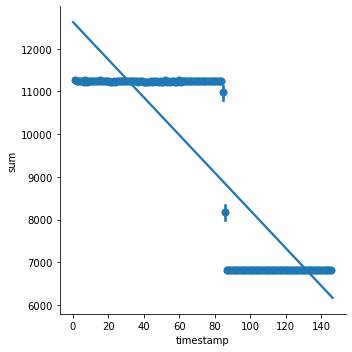

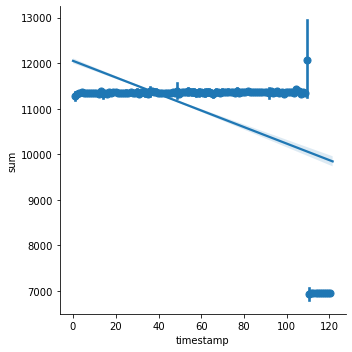

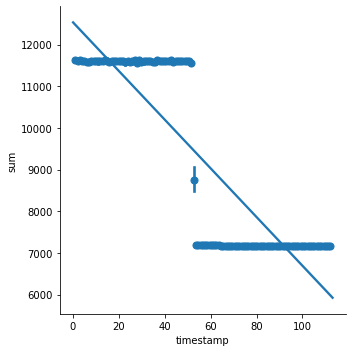

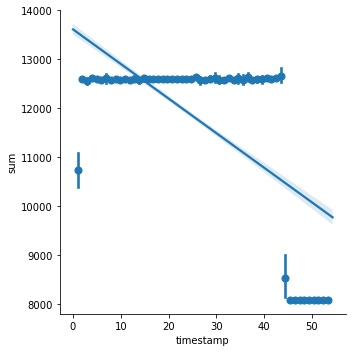

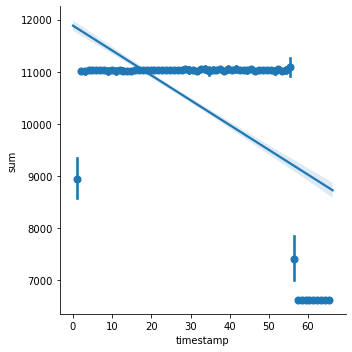

...

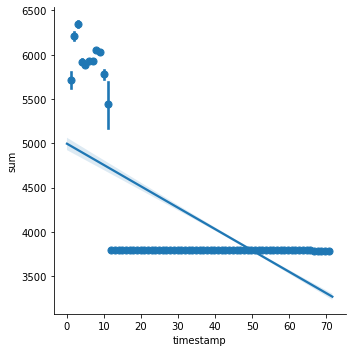

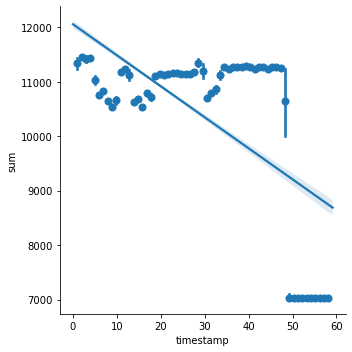

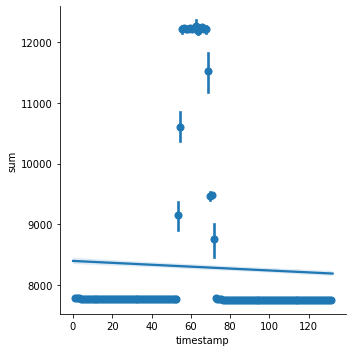

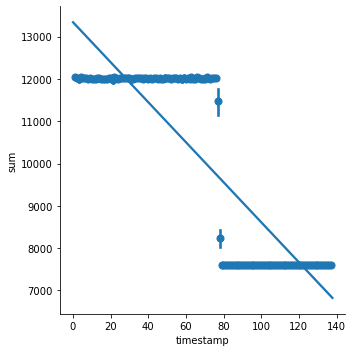

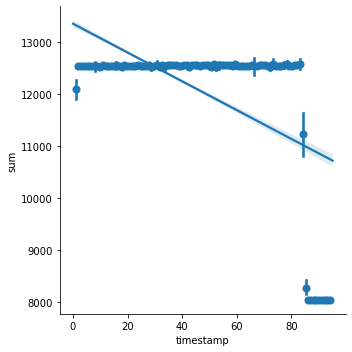

In [125]:
df_u=df_raw[(df_raw['final']=='u') & (df_raw['Device_ID']=='VB00000000000192')]['file']

data_path='Raw_data\VB00000000000192'

for i in df_u:
    u_path = os.path.join(data_path,i)
    u=pd.read_csv(u_path)
    sns.lmplot(data=u,x='timestamp',y='sum',x_bins=int(u['timestamp'].max()))

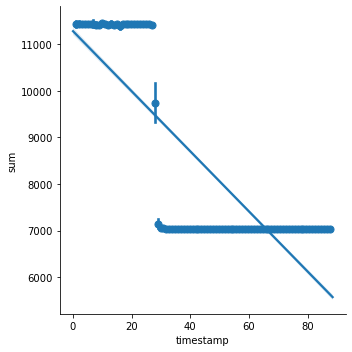

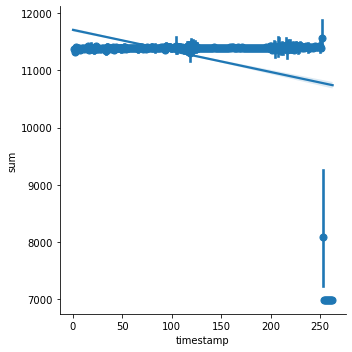

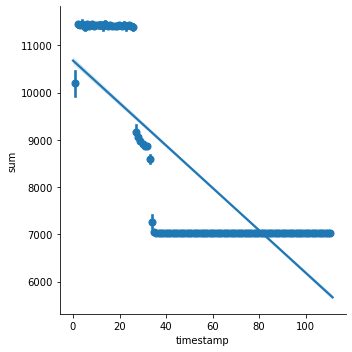

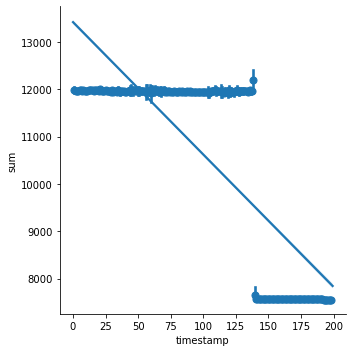

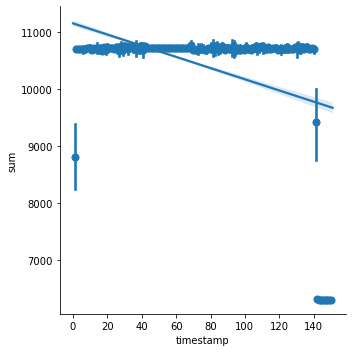

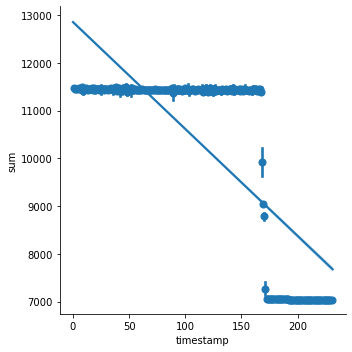

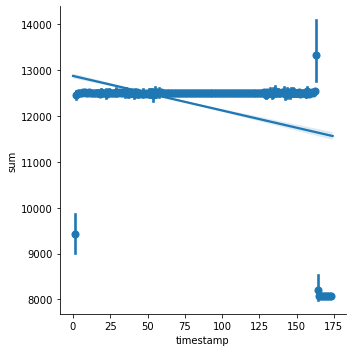

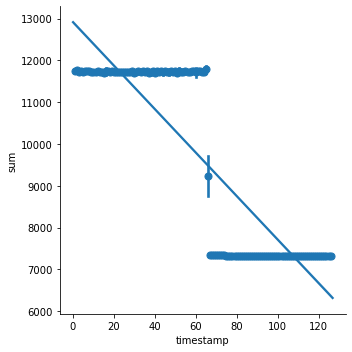

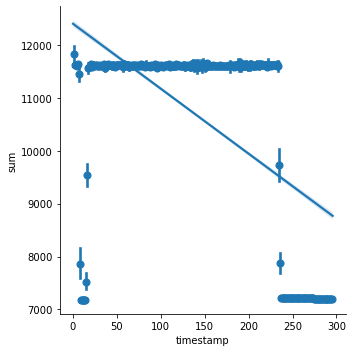

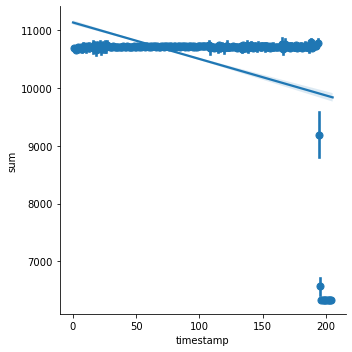

In [170]:
df_d=df_raw[(df_raw['final']=='d') & (df_raw['Device_ID']=='VB00000000000192')]['file']

data_path='Raw_data\VB00000000000192'

for i in df_d:
    d_path = os.path.join(data_path,i)
    d=pd.read_csv(d_path)
    sns.lmplot(data=d,x='timestamp',y='sum',x_bins=int(d['timestamp'].max()))

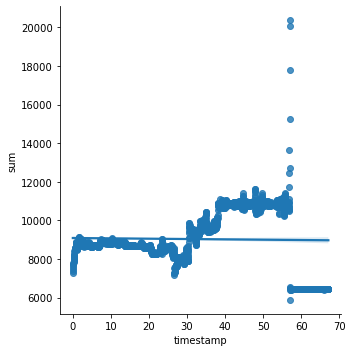

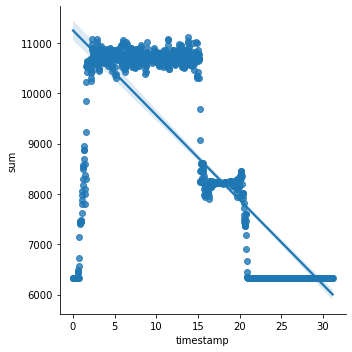

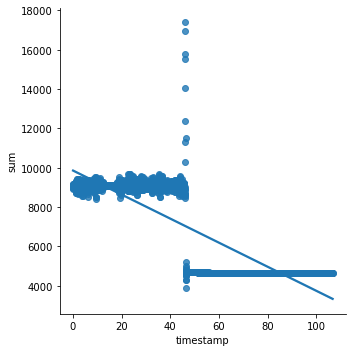

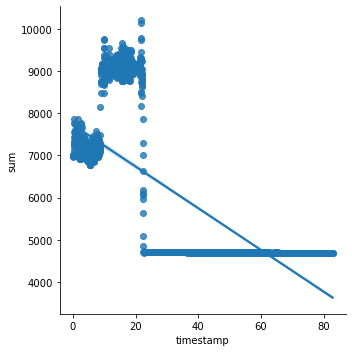

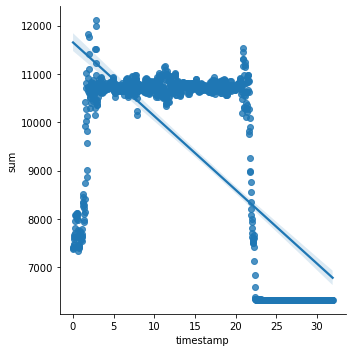

...

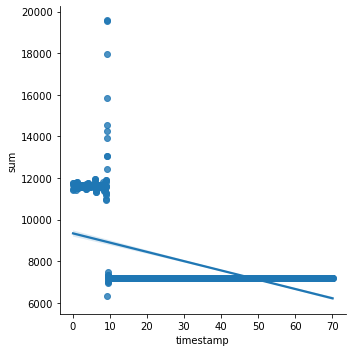

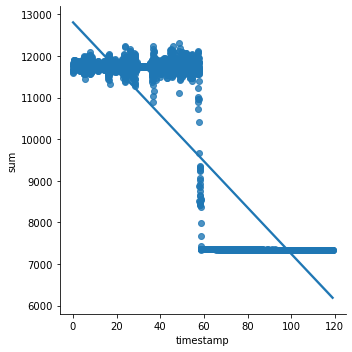

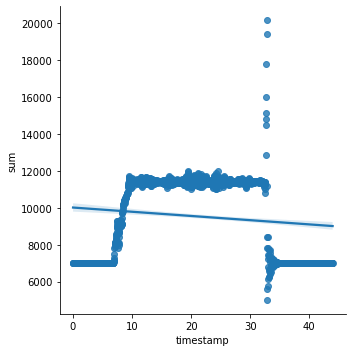

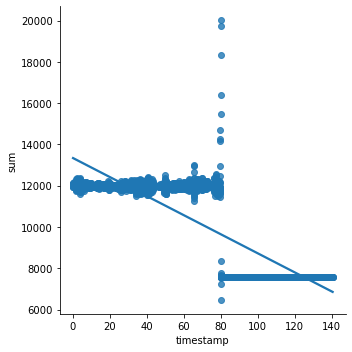

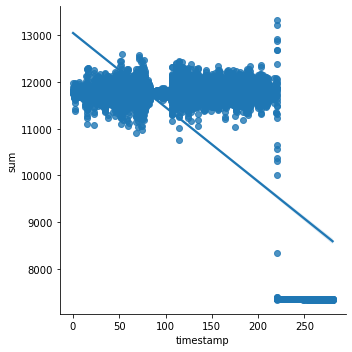

In [132]:
df_ne=df_raw[(df_raw['final']=='ne') & (df_raw['Device_ID']=='VB00000000000192')]['file']

data_path='Raw_data\VB00000000000192'

for i in df_ne:
    ne_path = os.path.join(data_path,i)
    ne=pd.read_csv(ne_path)
    sns.lmplot(data=ne,x='timestamp',y='sum')

<AxesSubplot:xlabel='timestamp'>

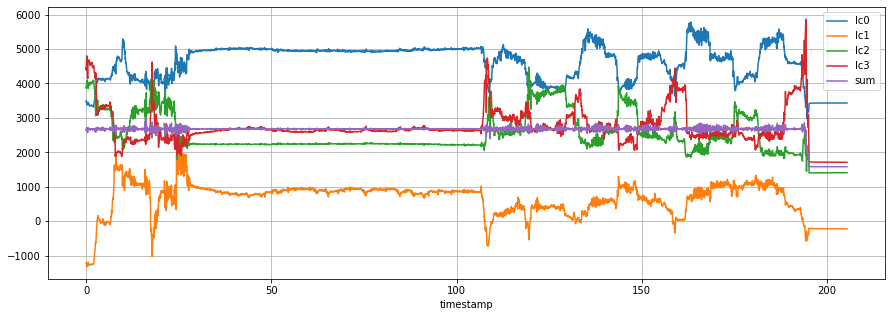

In [187]:
#d['sum']/=4
d.iloc[:,1:].plot(x='timestamp',figsize=(15,5), grid=True)

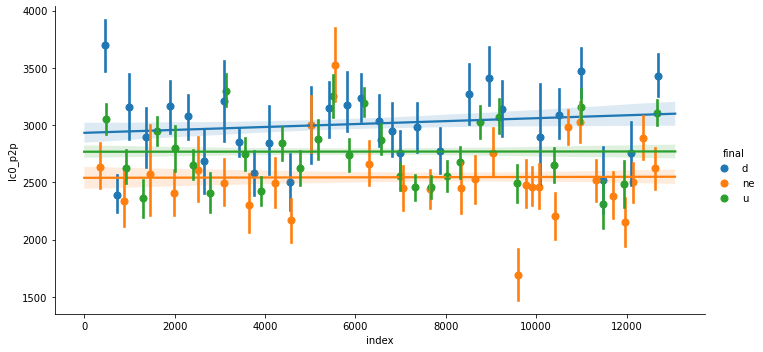

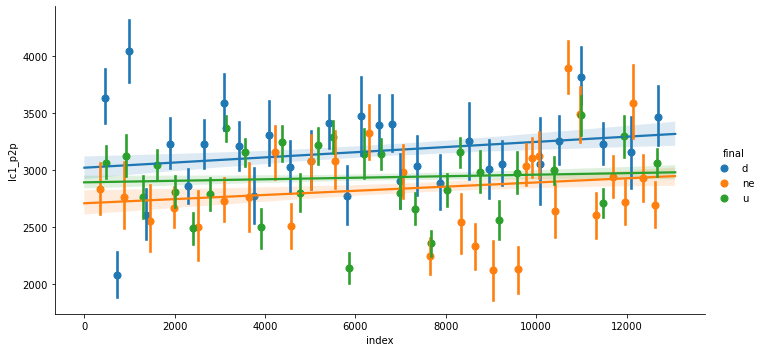

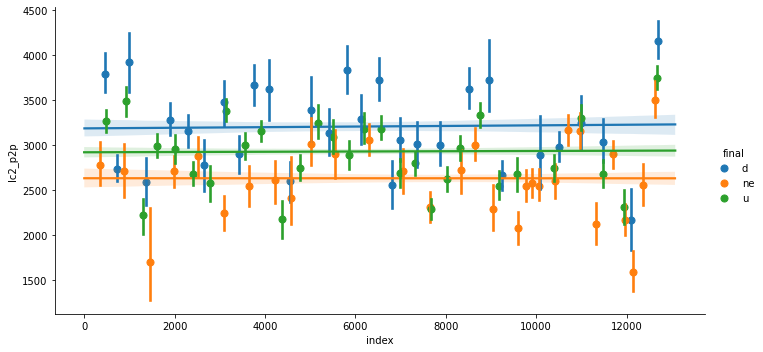

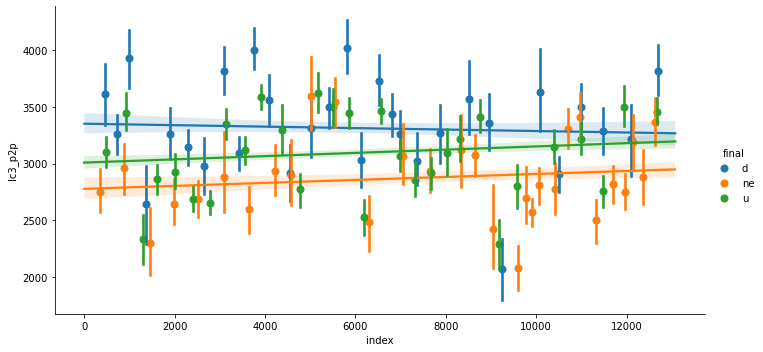

In [77]:
sns.lmplot(data=dff,x='index',y='lc0_p2p',hue='final',x_bins=30,aspect=2)
sns.lmplot(data=dff,x='index',y='lc1_p2p',hue='final',x_bins=30,aspect=2)
sns.lmplot(data=dff,x='index',y='lc2_p2p',hue='final',x_bins=30,aspect=2)
sns.lmplot(data=dff,x='index',y='lc3_p2p',hue='final',x_bins=30,aspect=2)

### Outlier Analysis

In [338]:
outlier_cols = ['Kurtosis']
#outlier_cols = ['median','Difference']


Q1 = dff_o[outlier_cols].quantile(0.1)
Q3 = dff_o[outlier_cols].quantile(0.9)
IQR=Q3-Q1
whisker_width=1.5

dff_o=dff_o[~((dff_o[outlier_cols]<Q1-whisker_width*IQR)|(dff_o[outlier_cols]>Q3+whisker_width*IQR)).any(axis=1)]

dff_o.shape

(12725, 34)

In [48]:
print(Q1-whisker_width*IQR,Q3+whisker_width*IQR)

Kurtosis   -10.6259
dtype: float64 Kurtosis    12.5205
dtype: float64


In [74]:
dff_o.reset_index(inplace=True)
dff_o.drop(['level_0'],axis=1,inplace=True)

### Bivariate Analysis 

<AxesSubplot:xlabel='Time_bin', ylabel='Skew'>

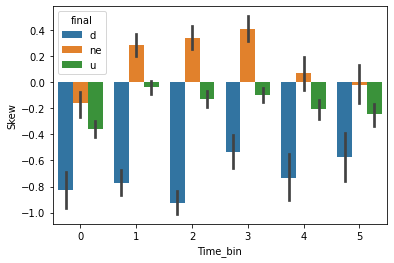

In [58]:
sns.barplot(x='Time_bin',y='Skew',data=dff_o,hue='final')

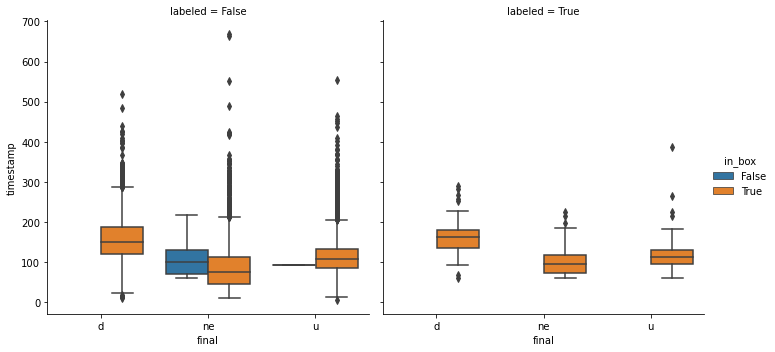

In [231]:
sns.catplot(data=dff,x='final',y='timestamp',hue='in_box',col='labeled',kind='box')

<AxesSubplot:xlabel='final', ylabel='std'>

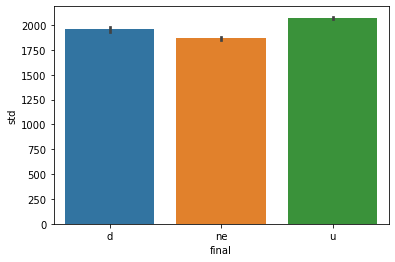

In [223]:
sns.barplot(data=dff, x='final', y='std')

<AxesSubplot:xlabel='final', ylabel='Age'>

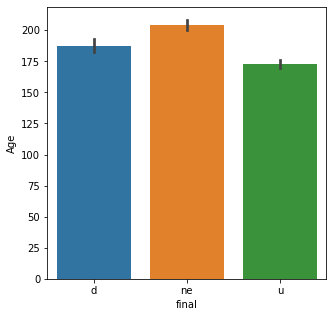

In [273]:
plt.figure(figsize=(10, 5))
sns.barplot(data=dff, x='final',y='Age')

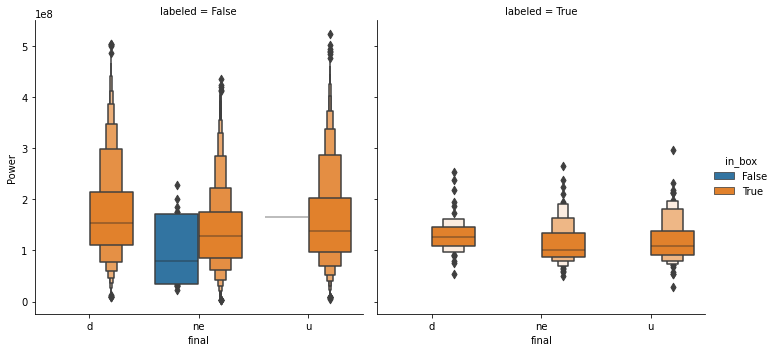

In [165]:
sns.catplot(data=dff, x='final',y='Power',hue='in_box',col='labeled',kind='boxen')

In [150]:
#percentage of elimination and non elimination of each cat.
time=pd.crosstab(dff['Name_of_cat'],columns=dff['final'],values=dff['timestamp'],aggfunc='mean')
time

final,d,ne,u
Name_of_cat,,,
Abby,141.042136,126.374641,114.971797
Azure,156.861050,60.277294,134.867204
Betty Lou,142.874764,78.290662,86.167978
Bill,176.432143,86.740217,107.560185
Boots,158.073113,97.425000,94.111329
Bucks,110.253750,75.361212,97.810000
Cartman,149.525327,89.617016,114.709491
Corned Beef,176.241442,101.994292,122.957755
Cracker Jack,162.072308,94.745365,131.116898


Text(0, 0.5, 'time duration')

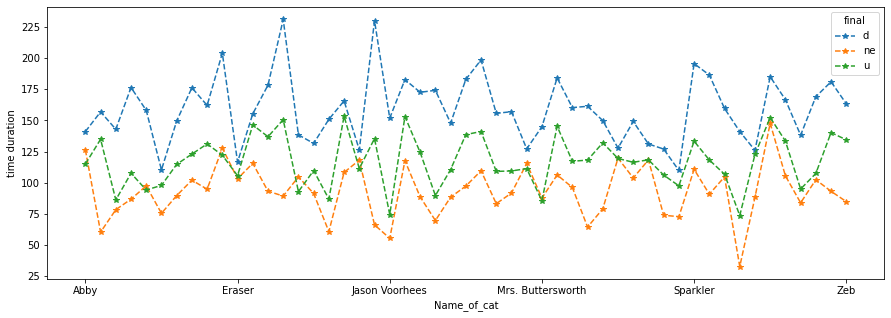

In [151]:
plt.rcParams['figure.figsize']=(15,5)
time.plot(kind='line',linestyle='--',marker='*')
plt.xlabel('Name_of_cat')
plt.ylabel('time duration')

### Behaviour Activities during elimination

In [459]:
from scipy.stats import ttest_ind
dig=dff[dff['2 paws digging']==1]
dt= dig[dig["class"] != 0]

In [476]:
sample1= dt['timestamp']
sample2 = dt['class']

ttest_ind(sample1, sample2)

Ttest_indResult(statistic=16.554556381064863, pvalue=2.7893046533558356e-37)

In [471]:
sample1 = dt['Power']
sample2 = dt['class']

ttest_ind(array1, array2)

Ttest_indResult(statistic=21.58288041994934, pvalue=1.4369066628016069e-50)

In [473]:
sample1 = dt['Weight_of_cat']
sample2 = dt['class']

ttest_ind(array1, array2)

Ttest_indResult(statistic=53.47553342388529, pvalue=2.9408791195372563e-108)

p<0.05 i.e., rejected H0 or different distributions

<AxesSubplot:xlabel='final'>

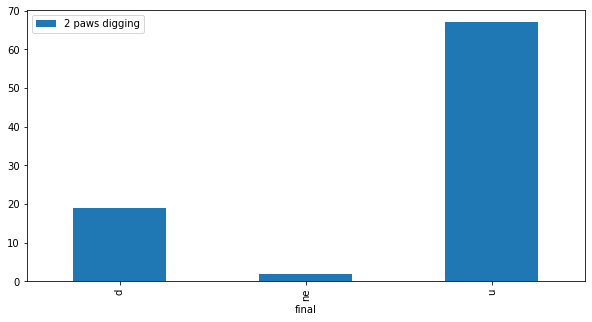

In [480]:
plt.rcParams['figure.figsize']=(10,5)
dff_paw=dff[dff['2 paws digging']==1][['Name_of_cat','final','2 paws digging']]
dff_paw.groupby(['final']).agg({'2 paws digging':'count'}).plot(kind='bar')

In [488]:
stats.chi2_contingency(pd.crosstab(dff_paw['2 paws digging'],dff_paw['final']))

(0.0, 1.0, 0, array([[19.,  2., 67.]]))

In [477]:
from scipy.stats import ttest_ind
feet=dff[dff['Unit feet set to 5mm']==1]
dt1= feet[feet["class"] != 0]

In [483]:
sample1= feet['timestamp']
sample2 = feet['class']

ttest_ind(sample1, sample2)

Ttest_indResult(statistic=30.408840834007574, pvalue=2.5982980589305993e-91)

In [484]:
sample1 = feet['Power']
sample2 = feet['class']

ttest_ind(array1, array2)

Ttest_indResult(statistic=53.47553342388529, pvalue=2.9408791195372563e-108)

<AxesSubplot:xlabel='final'>

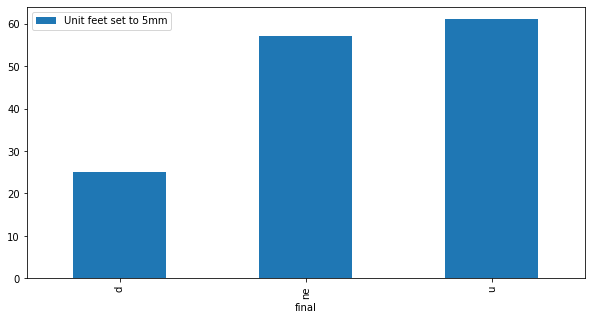

In [482]:
plt.rcParams['figure.figsize']=(10,5)
dff_a=dff[dff['Unit feet set to 5mm']==1].groupby(['final']).agg({'Unit feet set to 5mm':'count'})
dff_a.plot(kind='bar')

In [340]:
stats.chi2_contingency(dff_a)

(0.0,
 1.0,
 0,
 array([[24.],
        [61.],
        [58.]]))

In [149]:
dff['index']=dff.index

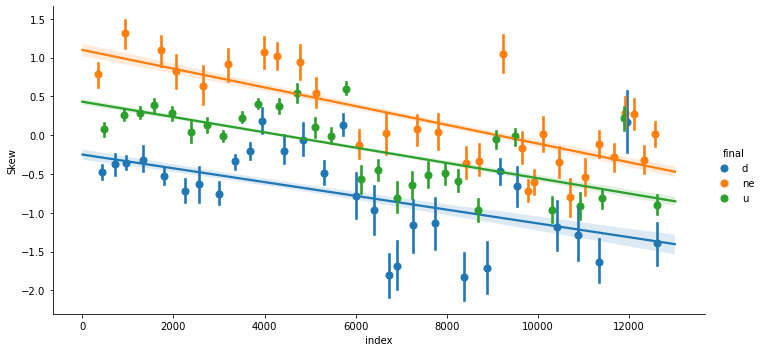

In [159]:
sns.lmplot(data=dff_o,x='index',y ='Skew', hue='final',x_bins=30,aspect=2)

non elimination data is highly skewed 

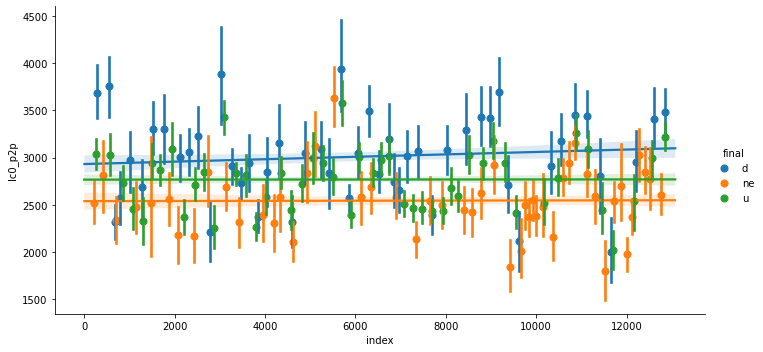

In [152]:
sns.lmplot(data=dff,x='index',y='lc0_p2p',hue='final',aspect=2,x_bins=50)

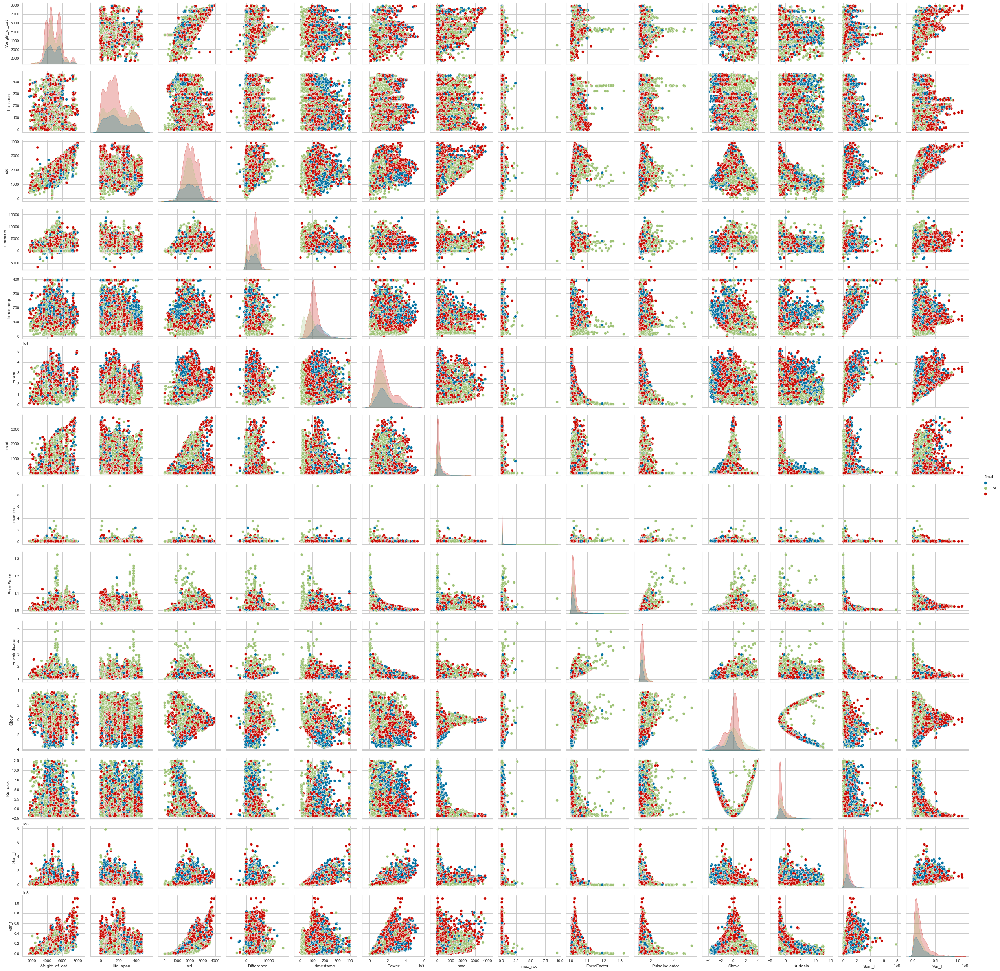

In [554]:
sns.pairplot(dff,hue='final')

f-value < 1 i.e., samples have similar mean 

p value>0.05 so failed to reject null hypothesis i.e no proper evidence to prove statistically significant difference between samples

In [77]:
# pd.DataFrame(data=mc_results._results_table.data[1:], columns=mc_results._results_table.data[0])

In [70]:
dff_o.to_csv('final_data.csv')

In [52]:
dff_o=pd.read_csv('final_data.csv')

## Feature Engineering

### Dividing data for 2 models

In [53]:
dff_o.reset_index(inplace=True)

In [56]:
dff_o.drop(['Name_of_cat','class','level_0','index','Event_ID'],axis=1,inplace=True)

In [57]:
dff_o['Year']=dff_o['Year'].astype('category')
dff_o['Month']=dff_o['Month'].astype('category')

dff_o['2 paws digging']=dff_o['2 paws digging'].astype('category')
dff_o['Unit feet set to 5mm']=dff_o['Unit feet set to 5mm'].astype('category')

In [58]:
num_cols = list(dff_o.select_dtypes([np.number]).columns)

In [59]:
# Scaling

from sklearn.preprocessing import RobustScaler
scaler=RobustScaler(quantile_range = (0.2,0.8))
scaler.fit(dff_o[num_cols])
df_o=scaler.transform(dff_o[num_cols])

from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
scaler.fit(df_o)
df_o=scaler.transform(df_o)

df_o=pd.DataFrame(df_o,columns=num_cols)
df_o

,Weight_of_cat,Time_bin,Age,lco_mean,lc1_mean,lc2_mean,lc3_mean,lc1_var,lc0_p2p,lc1_p2p,...,mad,max_roc,P2p,FormFactor,PulseIndicator,Energy,Skew,Kurtosis,Sum_f,Var_f
0,2.033946,-0.046065,-0.972266,0.346519,0.239705,0.986943,-1.710855,1.161666,0.369874,1.449034,...,-0.507875,0.097741,0.559162,0.341118,0.421253,-0.172037,0.625635,-0.111593,0.204451,0.759173
1,2.437683,0.615680,-1.348199,0.942517,-0.173743,1.306178,-1.733524,-0.631438,1.843104,0.443020,...,-0.465283,0.061749,1.163456,1.026893,0.205146,0.167414,0.114636,-0.163798,0.059590,2.263431
2,0.341984,0.615680,-0.987610,-0.594823,1.315879,0.261140,-1.211763,0.603630,-0.015381,1.012537,...,-0.279175,-0.244181,0.286486,0.455414,0.185851,-0.303941,0.225560,-0.156723,-0.310470,0.369108
3,2.493693,-0.046065,-1.002954,-0.054023,-0.038790,0.022725,-1.026492,-0.771370,-1.430740,-1.024183,...,-0.509727,-0.286172,0.690817,0.569710,1.139038,-0.600335,1.212038,0.044849,-0.712534,0.311697
4,2.522514,-0.707811,-1.187085,-0.372068,-0.009347,0.115991,-1.228620,0.267693,0.335151,0.339472,...,0.155079,-0.250180,0.701284,2.284147,0.147261,-0.713318,-0.211281,-0.155468,-0.659874,0.120172
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13010,-0.851724,-1.369556,1.743662,0.159763,-0.811237,0.006788,-0.261553,-0.579877,1.404111,-0.524760,...,-0.066214,0.601627,0.518398,-0.401805,-0.311967,-0.516187,-0.943506,-0.014715,-0.732198,-0.783297
13011,-0.282292,-0.707811,0.823009,0.323648,-1.454971,-0.271960,-0.764532,-0.721540,-1.770525,-0.566179,...,-0.504172,-0.184195,-0.411454,-0.287509,0.895917,-0.965029,1.512405,0.167630,-0.551006,-0.815421
13012,-0.501663,-1.369556,0.830681,0.980386,-1.187557,-0.394192,-0.573616,0.348682,-0.380795,1.289728,...,-0.064363,-0.184195,-0.618027,0.226822,-0.373712,-0.554566,-0.120299,-0.161687,-0.212703,-0.343769
13013,-0.536669,-1.369556,1.812711,0.872331,-1.309932,-0.298384,-0.193869,-0.657014,0.051584,-0.388554,...,-0.444913,0.397673,-0.036869,-0.858988,-0.566665,-0.498551,-2.293291,0.688935,0.307679,-1.029909


In [63]:
mapping = {'ne':'ne','u':'e','d':'e'}
dff_o['class'] = dff_o['final'].replace(mapping)

df_class=dff_o.drop(['final'],axis=1)

df_multi=dff_o.drop(['class'],axis=1)

In [64]:
df_multi=df_multi[~df_multi.final.eq('ne').groupby(df_multi.final).transform('any')]

## Classification

In [100]:
categorical_cols = list(set(df_class.columns) - set(num_cols))
categorical_cols
#categorical_cols=['Time_bin', 'Year', 'Name_of_cat']

['class',
 'labeled',
 'Month',
 'Time_bin',
 'in_box',
 'Year',
 'Unit feet set to 5mm',
 '2 paws digging']

In [101]:
dff_c= pd.get_dummies(data=df_class, columns =categorical_cols,drop_first=True)
#dff_1.drop(['class_ne'],axis=1,inplace=True)
#df_c.reset_index()

In [102]:
dff_c[num_cols]=df_o[num_cols]

In [103]:
X=dff_c.drop(['class_ne'],axis=1)
y=dff_c['class_ne']

In [109]:
import statsmodels.formula.api as smf
import statsmodels.api as sm

logit = sm.Logit(y,sm.add_constant(X)).fit()
logit.summary()

Optimization terminated successfully.
         Current function value: inf
         Iterations 8


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:               class_ne   No. Observations:                13015
Model:                          Logit   Df Residuals:                    12976
Method:                           MLE   Df Model:                           38
Date:                Sun, 11 Dec 2022   Pseudo R-squ.:                     inf
Time:                        21:32:52   Log-Likelihood:                   -inf
converged:                       True   LL-Null:                        0.0000
Covariance Type:            nonrobust   LLR p-value:                     1.000
==========================================================================================
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      2.3136      1.055      2.193      0.028       0.246       4.381
Weight_of_cat              0.4163      0.037     11.123      0.000       0.343       0.490
Age                        0.1996      0.030      6.642      0.000       0.141       0.259
lco_mean                  -0.9330      0.159     -5.880      0.000      -1.244      -0.622
lc1_mean                  -0.9111      0.132     -6.915      0.000      -1.169      -0.653
lc2_mean                  -1.0169      0.147     -6.901      0.000      -1.306      -0.728
lc3_mean                  -0.8114      0.147     -5.505      0.000      -1.100      -0.522
lc1_var                    0.0633      0.024      2.645      0.008       0.016       0.110
lc0_p2p                   -0.0990      0.027     -3.696      0.000      -0.152      -0.047
lc2_p2p                   -0.0837      0.027     -3.115      0.002      -0.136      -0.031
lc3_p2p                   -0.1031      0.027     -3.787      0.000      -0.157      -0.050
max                        1.3749      0.254      5.420      0.000       0.878       1.872
median                     0.8017      0.077     10.409      0.000       0.651       0.953
std                        0.3999      0.068      5.876      0.000       0.267       0.533
Difference                -0.1598      0.024     -6.627      0.000      -0.207      -0.113
timestamp                 -0.5780      0.058     -9.967      0.000      -0.692      -0.464
max_roc                    0.0695      0.030      2.346      0.019       0.011       0.128
P2p                       -0.6494      0.109     -5.979      0.000      -0.862      -0.437
FormFactor                -0.3070      0.054     -5.722      0.000      -0.412      -0.202
PulseIndicator             0.3387      0.095      3.575      0.000       0.153       0.524
Skew                       0.5529      0.075      7.387      0.000       0.406       0.700
Kurtosis                  -0.1315      0.051     -2.584      0.010      -0.231      -0.032
Sum_f                      0.2828      0.073      3.858      0.000       0.139       0.426
Var_f                     -0.7120      0.070    -10.222      0.000      -0.849      -0.575
labeled_True               0.5284      0.169      3.131      0.002       0.198       0.859
Month_2                   -0.4105      0.150     -2.736      0.006      -0.705      -0.116
Month_4                    0.2331      0.078      3.002      0.003       0.081       0.385
Month_6                   -1.3831      0.287     -4.821      0.000      -1.945      -0.821
Month_8                    0.7868      0.089      8.869      0.000       0.613       0.961
Month_9                    0.9191      0.087     10.569      0.000       0.749       1.090
Month_10                   0.4687      0.104      4.490      0.000       0.264       0.673
Month_12                   0.4254      0.114      3.734      0.000       0.202       0.649
Time_bin_1                -0.1240      0.055     -2.235 

dropping variables with high p values

In [108]:
X.drop(['Time_bin_5','Month_11','lc1_p2p','mad','Month_7','Month_5','Month_3',
        'Time_bin_2'],axis=1,inplace=True)

In [302]:
X.isnull().sum()

Weight_of_cat             0
Age                       0
lco_mean                  0
lc1_mean                  0
lc2_mean                  0
lc3_mean                  0
lc1_var                   0
lc0_p2p                   0
lc2_p2p                   0
lc3_p2p                   0
max                       0
median                    0
std                       0
Difference                0
timestamp                 0
max_roc                   0
P2p                       0
FormFactor                0
PulseIndicator            0
Skew                      0
Kurtosis                  0
Sum_f                     0
Var_f                     0
Month_2                   0
Month_4                   0
Month_6                   0
Month_8                   0
Month_9                   0
Month_10                  0
Month_12                  0
Time_bin_1                0
Time_bin_3                0
Time_bin_4                0
Year_2021                 0
2 paws digging_1          0
labeled_True        

## Feature Selection

In [105]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=0)

X_train.shape,X_test.shape,X_val.shape

((8329, 46), (2603, 46), (2083, 46))

In [106]:
y_train.value_counts()

0    5645
1    2684
Name: class_ne, dtype: int64

smote analysis - over sampling the imbalanced data

In [110]:
from imblearn.over_sampling import SMOTE
smt=SMOTE(random_state=2)
X_train,y_train =smt.fit_resample(X_train, y_train)

In [111]:
y_train.value_counts()

0    5645
1    5645
Name: class_ne, dtype: int64

In [199]:
import shap
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_test)

In [204]:
choosen_instance = X_test.loc[[1238]]
sv = explainer.shap_values(choosen_instance)
shap.initjs()
shap.force_plot(explainer.expected_value[0], sv[0],choosen_instance)

In [203]:
#shap_values = explainer.shap_values(choosen_instance)
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0],X_test)

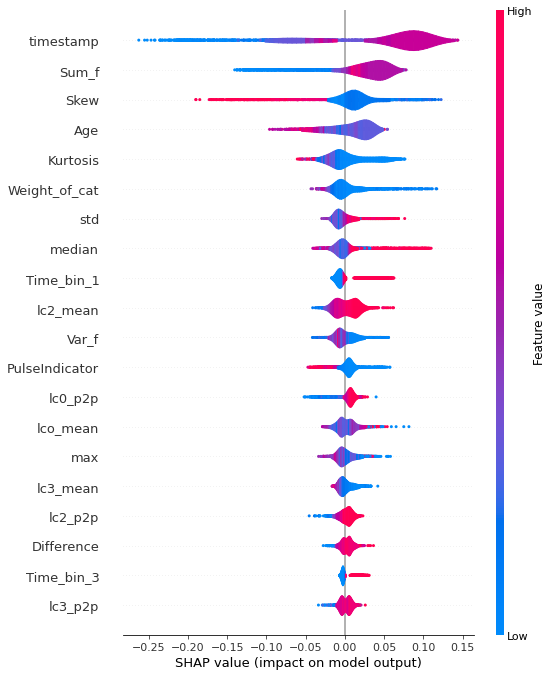

In [201]:
shap.summary_plot(shap_values[0], X_test, plot_type='violin')

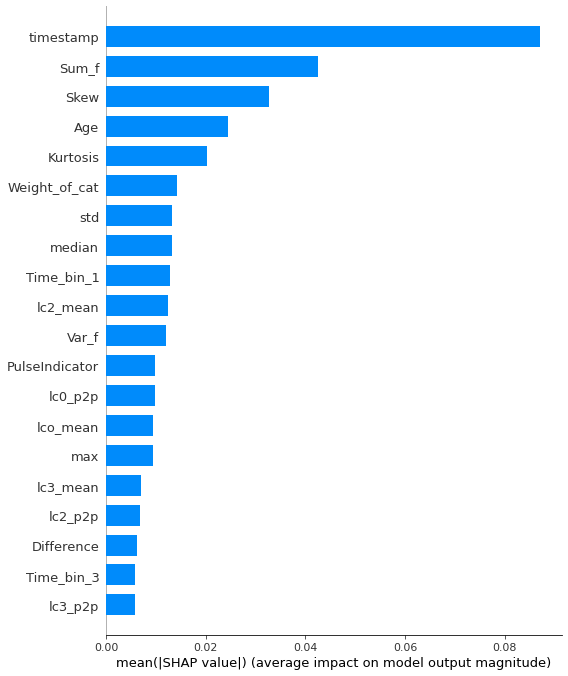

In [202]:
shap.summary_plot(shap_values[0], X_test,plot_type='bar')

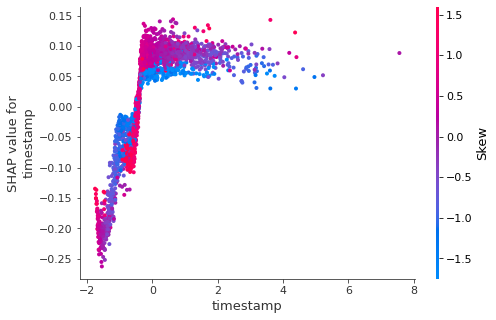

In [206]:
shap.dependence_plot('timestamp',shap_values[0],X_test)

## Model Interpretability 

In [387]:
import lime
from lime.lime_tabular import LimeTabularExplainer
import lightgbm as lgb

lgb_train = lgb.Dataset(X_train, y_train)
lgb_eval = lgb.Dataset(X_test, y_test)

In [388]:
lgb_params = {
    'task': 'train',
    'boosting_type': 'goss',
    'objective': 'binary',
    'metric':'binary_logloss',
    'metric': {'l2', 'auc'},
    'num_leaves': 50,
    'learning_rate': 0.1,
    'feature_fraction': 0.8,
    'bagging_fraction': 0.8,
    'verbose': None,
    'num_iteration':100,
    'num_threads':7,
    'max_depth':12,
    'min_data_in_leaf':100,
    'alpha':0.5}
model = lgb.train(lgb_params,lgb_train,num_boost_round=10,valid_sets=lgb_eval,early_stopping_rounds=5)


def prob(data):
    return np.array(list(zip(1-model.predict(data),model.predict(data))))

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 5645, number of negative: 5645
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001790 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5891
[LightGBM] [Info] Number of data points in the train set: 11290, number of used features: 36
[LightGBM] [Info] Using GOSS
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[1]	valid_0's auc: 0.79009	valid_0's l2: 0.235087
Training until validation scores don't improve for 5 rounds
[2]	valid_0's auc: 0.802538	valid_0's l2: 0.223343
[3]	valid_0's auc: 0.8106	valid_0's l2: 0.213055
[4]	valid_0's auc: 0.818569	valid_0's l2: 0.204665
[5]	valid_0's auc: 0.820671	valid_0's l2: 0.197016
[6]	valid_0's auc: 0.820638	valid_0's l2: 0.191361
[7]	vali

In [391]:
feature_names=model.feature_name()

In [ ]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train[model.feature_name()].astype(int).values,
                                                   mode='classification',
                                                   training_labels=dff['final'],
                                                   feature_names=model.feature_name(),
                                                   categorical_features=range(14,31))

In [ ]:
# Obtain the explanations from LIME for particular values in the validation dataset
i = 1
exp = explainer.explain_instance(X_train.loc[20,feature_names].astype(int).values, prob, num_features=14)

exp.show_in_notebook(show_table=True)

## Hyperparameter tuning 
### RandomizedSearchCV 

In [137]:
from sklearn.model_selection import RandomizedSearchCV

grid={'n_estimators':[100,200,250],'max_depth':[10,14],'criterion':["gini", "entropy", "log_loss"],
      'max_features':['auto','sqrt','log2'],'min_samples_split':[2,4,6],'min_samples_leaf':[1,2,4]}

rs=RandomizedSearchCV(estimator=rf,param_distributions=grid,n_iter=50,cv=8,verbose=2)
rs.fit(X_train,y_train)

Fitting 8 folds for each of 50 candidates, totalling 400 fits
[CV] END criterion=log_loss, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=100; total time=  10.7s
[CV] END criterion=log_loss, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=100; total time=  10.6s
[CV] END criterion=log_loss, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=100; total time=  10.4s
[CV] END criterion=log_loss, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=100; total time=  10.5s
[CV] END criterion=log_loss, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=100; total time=  10.6s
[CV] END criterion=log_loss, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=100; total time=  10.5s
[CV] END criterion=log_loss, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_spli

[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   4.3s
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   3.7s
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   3.8s
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   3.9s
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   4.2s
[CV] END criterion=log_loss, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   2.9s
[CV] END criterion=log_loss, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   3.0s
[CV] END criterion=log_loss, max_depth=1

[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=6, n_estimators=250; total time=   6.9s
[CV] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=250; total time=   8.5s
[CV] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=250; total time=   9.0s
[CV] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=250; total time=   9.0s
[CV] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=250; total time=   8.3s
[CV] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=250; total time=   8.1s
[CV] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=250; total time=   8.2s
[CV] END criterion=entropy,

[CV] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=100; total time=   3.5s
[CV] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=100; total time=   3.7s
[CV] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=100; total time=   3.5s
[CV] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=100; total time=   3.5s
[CV] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=100; total time=   3.5s
[CV] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=100; total time=   3.4s
[CV] END criterion=log_loss, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=250; total time=   7.5s
[CV] END criterion=log_los

[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=200; total time=   4.5s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=200; total time=   4.9s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=200; total time=   4.1s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   5.9s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   5.6s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   6.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   5.7s
[CV] END criterion=entropy, max_dept

[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=200; total time=   5.0s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=200; total time=   4.9s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=200; total time=   5.2s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=200; total time=   5.7s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=200; total time=   5.8s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=200; total time=   4.7s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=200; total time=   4.6s
[CV] END criterion=log_loss

[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=6, n_estimators=200; total time=   3.8s
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=6, n_estimators=200; total time=   3.9s
[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=6, n_estimators=200; total time=   4.1s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=100; total time=   2.7s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=100; total time=   2.8s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=100; total time=   2.7s
[CV] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=100; total time=   2.8s
[CV] END criterion=entropy, max_dept

RandomizedSearchCV(cv=8,
                   estimator=RandomForestClassifier(max_depth=12,
                                                    n_estimators=250,
                                                    random_state=101),
                   n_iter=50,
                   param_distributions={'criterion': ['gini', 'entropy',
                                                      'log_loss'],
                                        'max_depth': [10, 14],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 4, 6],
                                        'n_estimators': [100, 200, 250]},
                   verbose=2)

In [138]:
rs.best_params_

{'n_estimators': 250,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'log2',
 'max_depth': 14,
 'criterion': 'gini'}

### GridSearchCV

In [109]:
grid_2={'n_estimators':[200],'max_depth':[9,10,14],
      'max_features':['auto'],'min_samples_split':[1,2],'min_samples_leaf':[1]}

In [110]:
from sklearn.model_selection import GridSearchCV

gs=GridSearchCV(estimator=rf,param_grid=grid_2,cv=10,verbose=2)
gs.fit(X_train,y_train)

Fitting 10 folds for each of 4 candidates, totalling 40 fits
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=1, n_estimators=200; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=1, n_estimators=200; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=1, n_estimators=200; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=1, n_estimators=200; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=1, n_estimators=200; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=1, n_estimators=200; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=1, n_estimators=200; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=1, 

GridSearchCV(cv=10,
             estimator=RandomForestClassifier(criterion='entropy',
                                              max_features='auto',
                                              n_estimators=200,
                                              random_state=101),
             param_grid={'max_depth': [None, 5], 'max_features': ['auto'],
                         'min_samples_leaf': [1], 'min_samples_split': [1, 2],
                         'n_estimators': [200]},
             verbose=2)

In [111]:
gs.best_params_

{'max_depth': None,
 'max_features': 'auto',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 200}

[00:57:54] WARNING: C:/Users/administrator/workspace/xgboost-win64_release_1.6.0/src/learner.cc:627: 
Parameters: { "eval_metrics" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




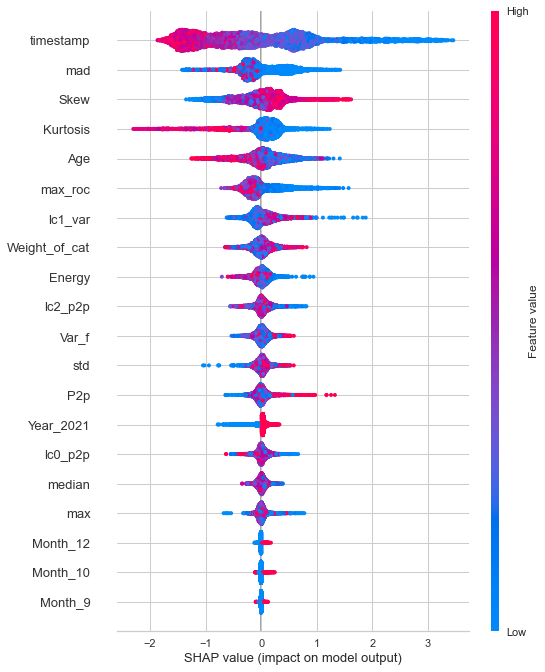

In [103]:
from sklearn.model_selection import GridSearchCV
from xgboost import XGBClassifier


xgb_model = XGBClassifier(n_estimators=350, max_depth=12, 
                        learning_rate=0.01, random_state=49,
                        eval_metrics='mlogloss')
xgb_model.fit(X_train, y_train)
explainer = shap.TreeExplainer(xgb_model)
shap_values = explainer.shap_values(X_train)

shap.summary_plot(shap_values, features=X_train, feature_names=X_train.columns)

In [102]:
import shap
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_test)

## Logistic Regression 

In [81]:
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.metrics import plot_roc_curve,plot_precision_recall_curve

In [82]:
from sklearn.linear_model import LogisticRegression
log_reg = LogisticRegression(C=1,solver='sag',max_iter=500,random_state =101)
log_reg.fit(X_train, y_train)

LogisticRegression(C=1, max_iter=500, random_state=101, solver='sag')

In [149]:
y_prob=log_reg.predict_proba(X_train).round(2)
y_pred = [0 if pval<0.47 else 1 for pval in y_prob[:,1]]  

In [155]:
from sklearn.metrics import roc_auc_score,roc_curve,plot_roc_curve

fpr,tpr,thres=roc_curve(y_train,y_prob[:,1],drop_intermediate=False)
roc_df=pd.DataFrame({'FPR':fpr,'TPR':tpr,'Thres':thres})
roc_df['Youden']=roc_df['TPR']-roc_df['FPR']
roc_df.head()

,FPR,TPR,Thres,Youden
0,0.000000,0.000000,2.00,0.000000
1,0.000000,0.000180,1.00,0.000180
2,0.000180,0.002881,0.99,0.002701
3,0.000900,0.010085,0.98,0.009184
4,0.001621,0.020349,0.97,0.018729


optimal threshold point around 0.5


Training
------------------------------------------------------------
Accuracy % age: 75.59
ROC-AUC Score: 0.824

Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.78      0.76      5645
           1       0.77      0.73      0.75      5645

    accuracy                           0.76     11290
   macro avg       0.76      0.76      0.76     11290
weighted avg       0.76      0.76      0.76     11290


Confusion Matrix:
[[4388 1257]
 [1499 4146]]

 ROC-AUC Curve for the training set


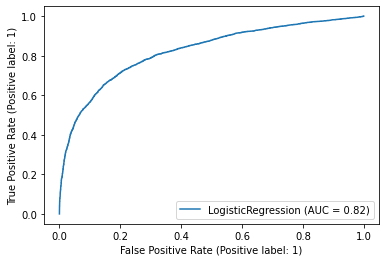


Validation
------------------------------------------------------------
Accuracy % age: 71.05
ROC-AUC Score: 0.741

Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.76      0.78      1384
           1       0.56      0.60      0.58       699

    accuracy                           0.71      2083
   macro avg       0.68      0.68      0.68      2083
weighted avg       0.72      0.71      0.71      2083


Confusion Matrix:
[[1058  326]
 [ 277  422]]

 ROC-AUC Curve for the validation set


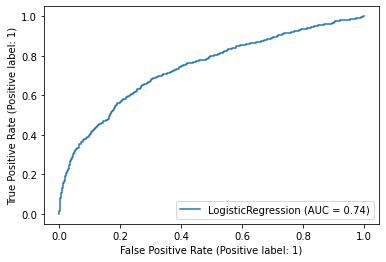


Testing
------------------------------------------------------------
Accuracy % age: 71.92
ROC-AUC Score: 0.736

Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.77      0.79      1738
           1       0.57      0.61      0.59       865

    accuracy                           0.72      2603
   macro avg       0.69      0.69      0.69      2603
weighted avg       0.72      0.72      0.72      2603


Confusion Matrix:
[[1344  394]
 [ 337  528]]

 ROC-AUC Curve for the testing set


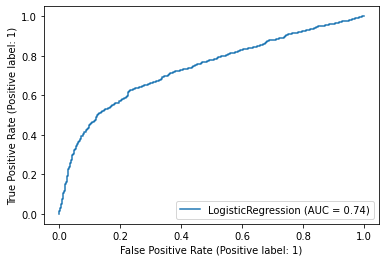

In [115]:
def error_metrics(actual, predicted, X_data):
    print('Accuracy % age: ' + str(np.round(accuracy_score(actual, predicted)*100, 2)))
    print('ROC-AUC Score: ' + str(np.round(roc_auc_score(actual, log_reg.predict_proba(X_data)[:,1]),3)))
    print('\nClassification Report:')
    print(classification_report(actual, predicted))
    print('\nConfusion Matrix:')
    print(confusion_matrix(actual, predicted))
    return "Done"


### Training Dataset metrics and ROC-AUC Curve
print("\nTraining\n------------------------------------------------------------")

y_train_pred = log_reg.predict(X_train)
error_metrics(y_train, y_train_pred, X_train)

print("\n ROC-AUC Curve for the training set")
plot_roc_curve(log_reg, X_train, y_train)
plt.show()

### Validation Dataset metrics and ROC-AUC Curve
print("\nValidation\n------------------------------------------------------------")

y_val_pred = log_reg.predict(X_val)
error_metrics(y_val, y_val_pred, X_val)

print("\n ROC-AUC Curve for the validation set")
plot_roc_curve(log_reg, X_val, y_val)
plt.show()

### Testing Dataset metrics and ROC-AUC Curve
print("\nTesting\n------------------------------------------------------------")
y_test_pred = log_reg.predict(X_test)
error_metrics(y_test, y_test_pred, X_test)

print("\n ROC-AUC Curve for the testing set")
lr_disp=plot_roc_curve(log_reg, X_test, y_test)
plt.show()

Cumulative Gains Curve - Logistic Regression


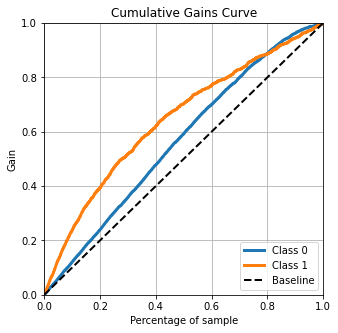

In [156]:
import scikitplot as skplt 

print("Cumulative Gains Curve - Logistic Regression")
skplt.metrics.plot_cumulative_gain(y_test, log_reg.predict_proba(X_test))
plt.show()

In [87]:
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn.metrics import get_scorer_names

In [117]:
cross_val_score(log_reg,X_test,y_test,cv=10,scoring='accuracy')

array([0.76628352, 0.80842912, 0.77394636, 0.79615385, 0.76153846,
       0.73846154, 0.8       , 0.75769231, 0.76153846, 0.75      ])

## Random Forest

In [139]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(criterion ='gini',random_state = 101,max_depth=12,n_estimators=250,
                           max_features= 'log2',min_samples_split= 2,min_samples_leaf=1)
rf.fit(X_train,y_train)

RandomForestClassifier(max_depth=12, max_features='log2', n_estimators=250,
                       random_state=101)

### OOB Rate

In [541]:
rf.set_params(warm_start=True, 
                  oob_score=True)

min_estimators = 15
max_estimators = 1000

error_rate = {}

for i in range(min_estimators, max_estimators + 1):
    rf.set_params(n_estimators=i)
    rf.fit(X_train,y_train)

    oob_error = 1 - rf.oob_score_
    error_rate[i] = oob_error

In [546]:
rf.oob_score_

0.8781522793404462

In [542]:
oob_series = pd.Series(error_rate)

Text(0.5, 1.0, 'OOB Error Rate Across various Forest sizes \n(From 15 to 1000 Trees)')

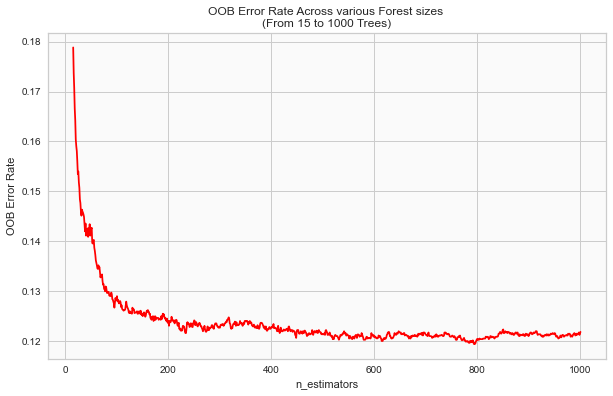

In [547]:
fig, ax = plt.subplots(figsize=(10,6))

ax.set_facecolor('#fafafa')

oob_series.plot(kind='line',color = 'red')
plt.xlabel('n_estimators')
plt.ylabel('OOB Error Rate')
plt.title('OOB Error Rate Across various Forest sizes \n(From 15 to 1000 Trees)')

In [558]:
print('OOB Error rate for 200 trees is: %0.5f'%oob_series[200])

OOB Error rate for 200 trees is: 0.12403


Error rate is almost constant after n estimators crossed 200 therefore n in between 200-300 can be considered as optimal point

In [548]:
rf.set_params(n_estimators=200,bootstrap=True,warm_start=False,oob_score=False)

RandomForestClassifier(n_estimators=600, random_state=101)


Training
------------------------------------------------------------
Accuracy % age: 98.14
ROC-AUC Score: 0.992

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      5645
           1       0.99      0.97      0.98      5645

    accuracy                           0.98     11290
   macro avg       0.98      0.98      0.98     11290
weighted avg       0.98      0.98      0.98     11290


Confusion Matrix:
[[5608   37]
 [ 173 5472]]

 ROC-AUC Curve for the training set


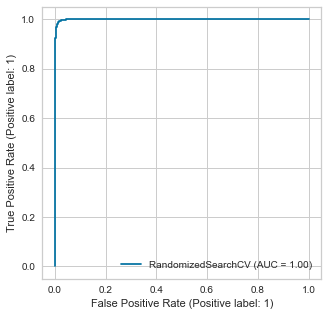


Validation
------------------------------------------------------------
Accuracy % age: 81.66
ROC-AUC Score: 0.862

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.90      0.87      1384
           1       0.76      0.66      0.71       699

    accuracy                           0.82      2083
   macro avg       0.80      0.78      0.79      2083
weighted avg       0.81      0.82      0.81      2083


Confusion Matrix:
[[1241  143]
 [ 239  460]]

 ROC-AUC Curve for the validation set


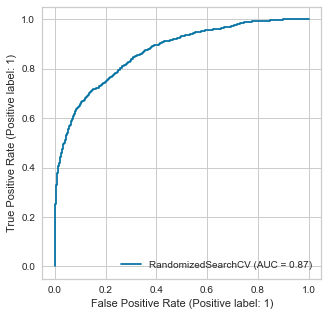


Testing
------------------------------------------------------------
Accuracy % age: 80.64
ROC-AUC Score: 0.853

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.88      0.86      1738
           1       0.73      0.66      0.69       865

    accuracy                           0.81      2603
   macro avg       0.79      0.77      0.78      2603
weighted avg       0.80      0.81      0.80      2603


Confusion Matrix:
[[1532  206]
 [ 298  567]]

 ROC-AUC Curve for the testing set


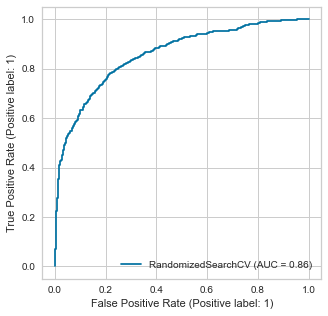

In [143]:
def error_metrics(actual, predicted, X_data):
    print('Accuracy % age: ' + str(np.round(accuracy_score(actual, predicted)*100, 2)))
    print('ROC-AUC Score: ' + str(np.round(roc_auc_score(actual, rf.predict_proba(X_data)[:,1]),3)))
    print('\nClassification Report:')
    print(classification_report(actual, predicted))
    print('\nConfusion Matrix:')
    print(confusion_matrix(actual, predicted))
    return "Done"


print("\nTraining\n------------------------------------------------------------")
y_train_pred = rf.predict(X_train)
error_metrics(y_train, y_train_pred, X_train)

print("\n ROC-AUC Curve for the training set")
plt.rcParams['figure.figsize']=(5,5)
plot_roc_curve(rf, X_train, y_train)
plt.show()

### Validation Dataset metrics and ROC-AUC Curve
print("\nValidation\n------------------------------------------------------------")

y_val_pred = rf.predict(X_val)
error_metrics(y_val, y_val_pred, X_val)

print("\n ROC-AUC Curve for the validation set")
plt.rcParams['figure.figsize']=(5,5)
plot_roc_curve(rf, X_val, y_val)
plt.show()

### Testing Dataset metrics and ROC-AUC Curve
print("\nTesting\n------------------------------------------------------------")
y_pred = rf.predict(X_test)
error_metrics(y_test, y_pred, X_test)

print("\n ROC-AUC Curve for the testing set")
plt.rcParams['figure.figsize']=(5,5)
rf_disp=plot_roc_curve(rf, X_test, y_test)
plt.show()

In [ ]:
confusion_matrix = confusion_matrix(y_test, y_pred)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])

cm_display.plot()
plt.show()

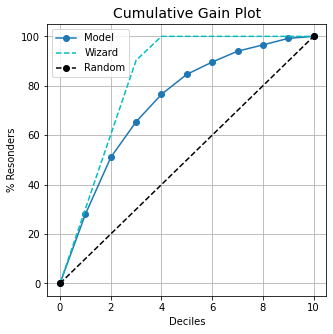

In [133]:
y_prob=rf.predict_proba(X_test).round(2)

import kds
kds.metrics.plot_cumulative_gain(y_test, y_prob[:,1])

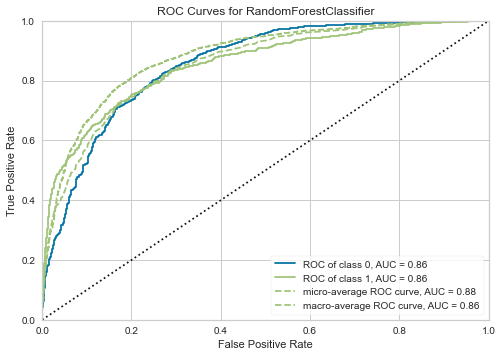

<AxesSubplot:title={'center':'ROC Curves for RandomForestClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [134]:
from yellowbrick.classifier import ROCAUC,PrecisionRecallCurve

visualizer=ROCAUC(rf,classes=[0,1])

visualizer.fit(X_train,y_train)
visualizer.score(X_test,y_test)
visualizer.show()

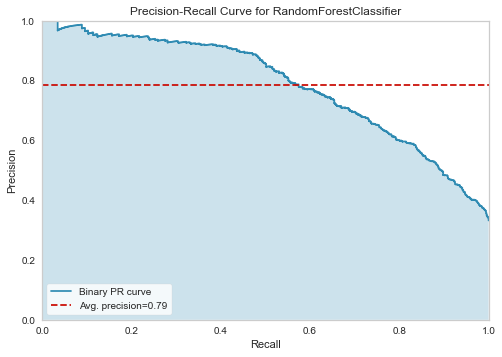

<AxesSubplot:title={'center':'Precision-Recall Curve for RandomForestClassifier'}, xlabel='Recall', ylabel='Precision'>

In [135]:
visualizer=PrecisionRecallCurve(rf,classes=[0,1])

visualizer.fit(X_train,y_train)
visualizer.score(X_test,y_test)
visualizer.show()

#### CrossValidation Scores

In [132]:
cross_val_score(rf,X_train,y_train,cv=10,scoring='accuracy')

array([0.82019486, 0.8210806 , 0.80513729, 0.79362267, 0.81222321,
       0.84233835, 0.85119575, 0.84676705, 0.84853853, 0.85031001])

In [130]:
cross_val_score(rf,X_test,y_test,cv=10,scoring='accuracy')

array([0.77011494, 0.80076628, 0.80842912, 0.81153846, 0.77307692,
       0.76923077, 0.81923077, 0.79230769, 0.80384615, 0.81153846])

#### Feature Importance

Text(0.5, 0, 'Variable Importance')

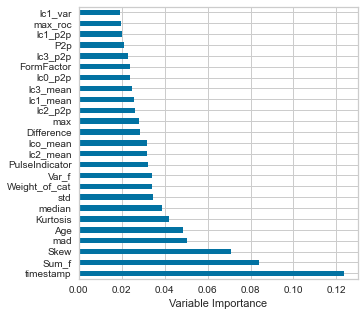

In [147]:
importance = pd.Series(rf.feature_importances_,index= X_train.columns.values)

importance.nlargest(25).plot(kind='barh')
plt.xlabel('Variable Importance')

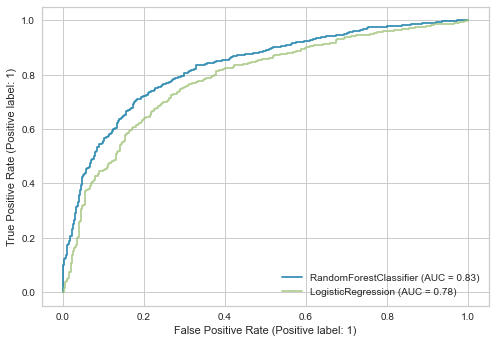

In [454]:
ax=plt.gca()
rf_disp.plot(ax=ax,alpha=0.8)
lr_disp.plot(ax=ax,alpha=0.8)

## Misclassification Analysis 

In [150]:
y_p=cross_val_predict(rf,X_train,y_train,cv=10)

In [151]:
crrct_p=y_p==y_train

In [152]:
X_train[~crrct_p]

,Weight_of_cat,Age,std,Difference,timestamp,Power,mad,max_roc,FormFactor,PulseIndicator,...,Month_3,Month_4,Month_5,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12
8,-0.664289,0.851729,-0.224617,0.881805,2.350126,-0.745339,-0.316249,-0.113176,0.053270,-0.397652,...,0,1,0,0,0,0,0,0,0,0
11,2.765097,0.620467,2.852098,2.342320,-0.347242,0.898147,-0.517408,0.071155,0.555797,0.388485,...,1,0,0,0,0,0,0,0,0,0
13,-0.700772,-0.487994,-0.824096,0.389728,2.093951,0.177855,0.563345,1.304755,-0.763335,-0.646501,...,0,0,0,0,0,0,0,0,0,1
18,0.619048,0.787932,-1.520055,-1.857678,-0.444230,-0.441288,-0.441499,0.042796,-0.826151,-0.233638,...,0,0,0,0,0,0,0,1,0,0
27,-0.492605,-1.237601,-0.124768,0.674244,0.587042,0.765874,0.064244,-0.269149,-0.637703,-0.861416,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,0.256632,1.436791,-0.372222,0.890698,-0.731092,-1.131635,0.342259,1.098784,0.649176,-0.015739,...,0,0,0,0,0,0,0,0,0,0
8769,-0.541575,-1.010177,0.194983,0.603226,-0.056738,-0.216876,0.104862,-0.427331,-0.169248,-0.455302,...,0,0,0,0,0,0,0,0,0,1
8784,-0.533404,0.746699,-0.349134,0.519574,-0.773874,-1.227779,-0.518688,0.426389,1.047731,1.051095,...,0,1,0,0,0,0,0,0,0,0
8785,-0.259157,-0.550072,-0.447723,0.515616,-0.826395,-1.017469,-0.526897,-0.155663,0.329739,1.072855,...,0,0,0,0,0,0,0,0,0,0


In [153]:
df_pred=X_train.copy()
df_pred['correct_pred']=crrct_p
df_pred['predicted']=y_p

In [154]:
df_pred_f=df_pred[df_pred['correct_pred']==False]
df_pred_t=df_pred[df_pred['correct_pred']==True]

<AxesSubplot:xlabel='Skew', ylabel='timestamp'>

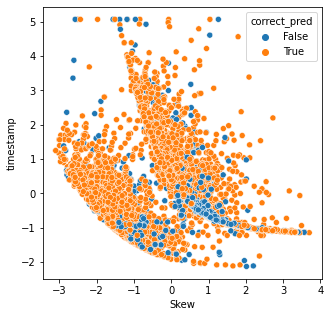

In [155]:
sns.scatterplot(x='Skew',y='timestamp',hue='correct_pred',data=df_pred)

## Multiclass Classification

df_multi.drop(['Month','lc0_p2p','lc1_p2p','lc3_p2p','Difference','FormFactor','PulseIndicator',
               'Sum_f','Var_f','Month'],axis=1,inplace=True)

In [65]:
categorical_cols = list(set(df_multi.columns) - set(num_cols))
dff_m= pd.get_dummies(data=df_multi, columns =categorical_cols,drop_first=True)
dff_m[num_cols]=df_o[num_cols]

In [71]:
X=dff_m.drop(['final_u'],axis=1)
y=dff_m['final_u']

In [75]:
logit = sm.Logit(y,sm.add_constant(X)).fit()
logit.summary()

Optimization terminated successfully.
         Current function value: inf
         Iterations 6


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                final_u   No. Observations:                 8767
Model:                          Logit   Df Residuals:                     8745
Method:                           MLE   Df Model:                           21
Date:                Mon, 12 Dec 2022   Pseudo R-squ.:                     inf
Time:                        00:11:03   Log-Likelihood:                   -inf
converged:                       True   LL-Null:                        0.0000
Covariance Type:            nonrobust   LLR p-value:                     1.000
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.6219      0.124      5.022      0.000       0.379       0.865
Weight_of_cat    -0.2116      0.053     -4.003      0.000      -0.315      -0.108
Age              -0.2196      0.039     -5.665      0.000      -0.296      -0.144
lc1_var           0.1296      0.037      3.522      0.000       0.057       0.202
lc0_p2p          -0.0328      0.033     -0.989      0.323      -0.098       0.032
lc2_p2p          -0.0817      0.034     -2.399      0.016      -0.148      -0.015
max              -0.2867      0.166     -1.730      0.084      -0.611       0.038
median           -0.6562      0.082     -7.971      0.000      -0.818      -0.495
std               0.2971      0.075      3.944      0.000       0.149       0.445
timestamp        -0.7211      0.038    -19.025      0.000      -0.795      -0.647
mad              -0.1538      0.027     -5.667      0.000      -0.207      -0.101
max_roc          -0.5167      0.086     -6.008      0.000      -0.685      -0.348
P2p               0.3019      0.093      3.230      0.001       0.119       0.485
Energy            0.7200      0.155      4.657      0.000       0.417       1.023
Skew              0.4960      0.076      6.549      0.000       0.348       0.644
Kurtosis         -0.5520      0.144     -3.825      0.000      -0.835      -0.269
Var_f            -0.0235      0.069     -0.341      0.733      -0.159       0.112
Year_2021         0.7177      0.112      6.401      0.000       0.498       0.937
Month_8           0.2357      0.115      2.054      0.040       0.011       0.461
Month_9           0.4362      0.115      3.804      0.000       0.211       0.661
Month_10          0.3894      0.133      2.937      0.003       0.130       0.649
Month_12          0.5564      0.130      4.293      0.000       0.302       0.810
=================================================================================
"""

dropping variables with high p values

In [74]:
X.drop(['Time_bin','Month_11','Month_7','Month_5','Month_3','Month_6','Month_4','Month_2',
        '2 paws digging_1','Unit feet set to 5mm_1','in_box_True','lc1_p2p',
        'lc3_p2p','Difference','FormFactor','PulseIndicator','Sum_f','labeled_True',
       'lco_mean','lc1_mean','lc2_mean','lc3_mean','Power','mean'],axis=1,inplace=True)

In [76]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=0)

X_train.shape,X_test.shape,X_val.shape

((5610, 21), (1754, 21), (1403, 21))

In [77]:
from imblearn.over_sampling import SMOTE
smt=SMOTE(random_state=2)
X_train,y_train =smt.fit_resample(X_train, y_train)

y_train.value_counts()

0    4124
1    4124
Name: final_u, dtype: int64

In [ ]:
import shap
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_test)

In [ ]:
choosen_instance = X_test.loc[[1238]]
sv = explainer.shap_values(choosen_instance)
shap.initjs()
shap.force_plot(explainer.expected_value[0], sv[0],choosen_instance)

In [ ]:
#shap_values = explainer.shap_values(choosen_instance)
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0],X_test)

In [ ]:
shap.summary_plot(shap_values[0], X_test, plot_type='violin')

In [ ]:
shap.summary_plot(shap_values[0], X_test,plot_type='bar')

In [ ]:
shap.dependence_plot('timestamp',shap_values[0],X_test)


Training
------------------------------------------------------------
Accuracy % age: 75.01
ROC-AUC Score: 0.805

Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.74      0.75      4124
           1       0.75      0.76      0.75      4124

    accuracy                           0.75      8248
   macro avg       0.75      0.75      0.75      8248
weighted avg       0.75      0.75      0.75      8248


Confusion Matrix:
[[3060 1064]
 [ 997 3127]]

 ROC-AUC Curve for the training set


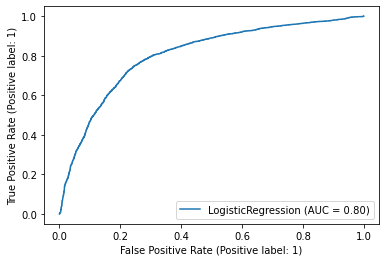


Validation
------------------------------------------------------------
Accuracy % age: 73.7
ROC-AUC Score: 0.784

Classification Report:
              precision    recall  f1-score   support

           0       0.51      0.72      0.60       378
           1       0.88      0.74      0.80      1025

    accuracy                           0.74      1403
   macro avg       0.69      0.73      0.70      1403
weighted avg       0.78      0.74      0.75      1403


Confusion Matrix:
[[274 104]
 [265 760]]

 ROC-AUC Curve for the validation set


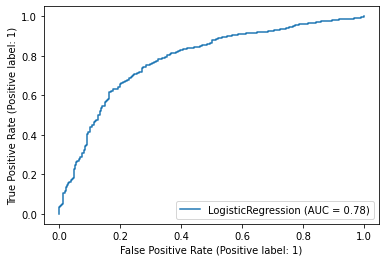


Testing
------------------------------------------------------------
Accuracy % age: 73.49
ROC-AUC Score: 0.771

Classification Report:
              precision    recall  f1-score   support

           0       0.49      0.71      0.58       451
           1       0.88      0.74      0.81      1303

    accuracy                           0.73      1754
   macro avg       0.69      0.73      0.69      1754
weighted avg       0.78      0.73      0.75      1754


Confusion Matrix:
[[320 131]
 [334 969]]

 ROC-AUC Curve for the testing set


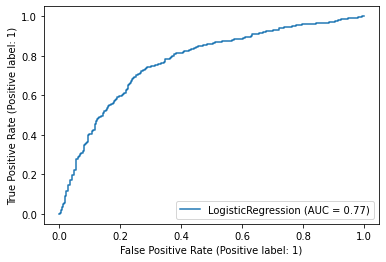

In [83]:
from sklearn.linear_model import LogisticRegression

log_reg = LogisticRegression(C=1,solver='sag',max_iter=500,random_state =101)
log_reg.fit(X_train, y_train)

def error_metrics(actual, predicted, X_data):
    print('Accuracy % age: ' + str(np.round(accuracy_score(actual, predicted)*100, 2)))
    print('ROC-AUC Score: ' + str(np.round(roc_auc_score(actual, log_reg.predict_proba(X_data)[:,1]),3)))
    print('\nClassification Report:')
    print(classification_report(actual, predicted))
    print('\nConfusion Matrix:')
    print(confusion_matrix(actual, predicted))
    return "Done"


### Training Dataset metrics and ROC-AUC Curve
print("\nTraining\n------------------------------------------------------------")

y_train_pred = log_reg.predict(X_train)
error_metrics(y_train, y_train_pred, X_train)

print("\n ROC-AUC Curve for the training set")
plot_roc_curve(log_reg, X_train, y_train)
plt.show()

### Validation Dataset metrics and ROC-AUC Curve
print("\nValidation\n------------------------------------------------------------")

y_val_pred = log_reg.predict(X_val)
error_metrics(y_val, y_val_pred, X_val)

print("\n ROC-AUC Curve for the validation set")
plot_roc_curve(log_reg, X_val, y_val)
plt.show()

### Testing Dataset metrics and ROC-AUC Curve
print("\nTesting\n------------------------------------------------------------")
y_test_pred = log_reg.predict(X_test)
error_metrics(y_test, y_test_pred, X_test)

print("\n ROC-AUC Curve for the testing set")
lr_disp=plot_roc_curve(log_reg, X_test, y_test)
plt.show()


In [ ]:
cross_val_score(log_reg,X_test,y_test,cv=10,scoring='accuracy')

In [ ]:
cross_val_score(log_reg,X_test,y_test,cv=10,scoring='f1')

In [99]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(criterion ='gini',random_state = 101,max_depth=11,n_estimators=250)
rf.fit(X_train,y_train)

RandomForestClassifier(max_depth=11, n_estimators=250, random_state=101)


Training
------------------------------------------------------------
Accuracy % age: 92.33
ROC-AUC Score: 0.979

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.95      0.93      4124
           1       0.95      0.90      0.92      4124

    accuracy                           0.92      8248
   macro avg       0.92      0.92      0.92      8248
weighted avg       0.92      0.92      0.92      8248


Confusion Matrix:
[[3913  211]
 [ 422 3702]]

 ROC-AUC Curve for the training set


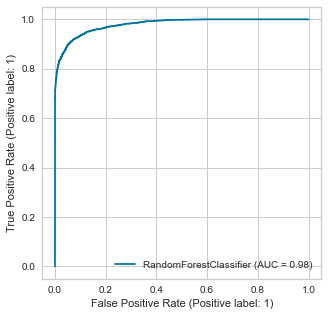


Validation
------------------------------------------------------------
Accuracy % age: 78.33
ROC-AUC Score: 0.841

Classification Report:
              precision    recall  f1-score   support

           0       0.58      0.70      0.64       378
           1       0.88      0.81      0.85      1025

    accuracy                           0.78      1403
   macro avg       0.73      0.76      0.74      1403
weighted avg       0.80      0.78      0.79      1403


Confusion Matrix:
[[266 112]
 [192 833]]

 ROC-AUC Curve for the validation set


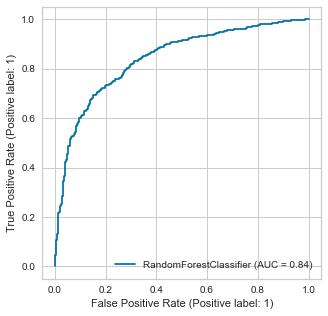


Testing
------------------------------------------------------------
Accuracy % age: 76.17
ROC-AUC Score: 0.817

Classification Report:
              precision    recall  f1-score   support

           0       0.53      0.68      0.60       451
           1       0.88      0.79      0.83      1303

    accuracy                           0.76      1754
   macro avg       0.70      0.74      0.71      1754
weighted avg       0.79      0.76      0.77      1754


Confusion Matrix:
[[ 308  143]
 [ 275 1028]]

 ROC-AUC Curve for the testing set


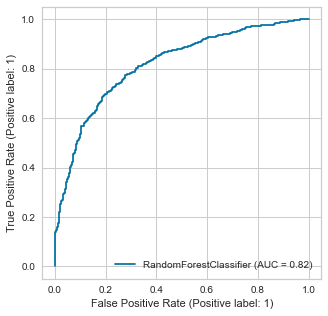

In [100]:
def error_metrics(actual, predicted, X_data):
    print('Accuracy % age: ' + str(np.round(accuracy_score(actual, predicted)*100, 2)))
    print('ROC-AUC Score: ' + str(np.round(roc_auc_score(actual, rf.predict_proba(X_data)[:,1]),3)))
    print('\nClassification Report:')
    print(classification_report(actual, predicted))
    print('\nConfusion Matrix:')
    print(confusion_matrix(actual, predicted))
    return "Done"


print("\nTraining\n------------------------------------------------------------")
y_train_pred = rf.predict(X_train)
error_metrics(y_train, y_train_pred, X_train)

print("\n ROC-AUC Curve for the training set")
plt.rcParams['figure.figsize']=(5,5)
plot_roc_curve(rf, X_train, y_train)
plt.show()

### Validation Dataset metrics and ROC-AUC Curve
print("\nValidation\n------------------------------------------------------------")

y_val_pred = rf.predict(X_val)
error_metrics(y_val, y_val_pred, X_val)

print("\n ROC-AUC Curve for the validation set")
plt.rcParams['figure.figsize']=(5,5)
plot_roc_curve(rf, X_val, y_val)
plt.show()

### Testing Dataset metrics and ROC-AUC Curve
print("\nTesting\n------------------------------------------------------------")
y_pred = rf.predict(X_test)
error_metrics(y_test, y_pred, X_test)

print("\n ROC-AUC Curve for the testing set")
plt.rcParams['figure.figsize']=(5,5)
rf_disp=plot_roc_curve(rf, X_test, y_test)
plt.show()

In [88]:
cross_val_score(rf,X_train,y_train,cv=10,scoring='accuracy')

array([0.82545455, 0.8169697 , 0.81818182, 0.83878788, 0.87757576,
       0.88121212, 0.87151515, 0.86666667, 0.86650485, 0.86286408])

In [89]:
cross_val_score(rf,X_test,y_test,cv=10,scoring='accuracy')

array([0.80113636, 0.76704545, 0.78409091, 0.78977273, 0.80571429,
       0.75428571, 0.80571429, 0.74857143, 0.76571429, 0.8       ])

In [90]:
cross_val_score(rf,X_test,y_test,cv=10,scoring='f1')

array([0.87179487, 0.85198556, 0.86524823, 0.86545455, 0.87591241,
       0.84587814, 0.87943262, 0.84397163, 0.84870849, 0.87544484])

Text(0.5, 0, 'Variable Importance')

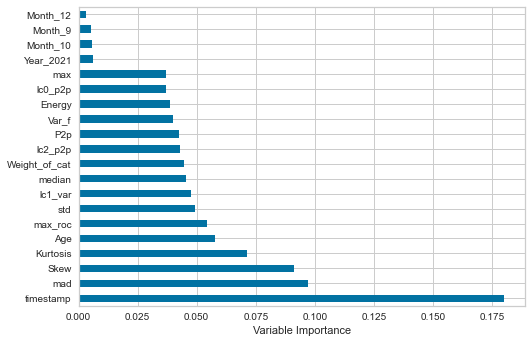

In [94]:
importance = pd.Series(rf.feature_importances_,index= X.columns.values)

importance.nlargest(20).plot(kind='barh')
plt.xlabel('Variable Importance')

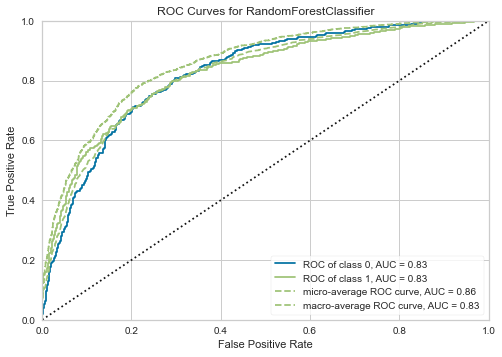

<AxesSubplot:title={'center':'ROC Curves for RandomForestClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [92]:
from yellowbrick.classifier import ROCAUC,PrecisionRecallCurve

visualizer=ROCAUC(rf,classes=[0,1])

visualizer.fit(X_train,y_train)
visualizer.score(X_test,y_test)
visualizer.show()

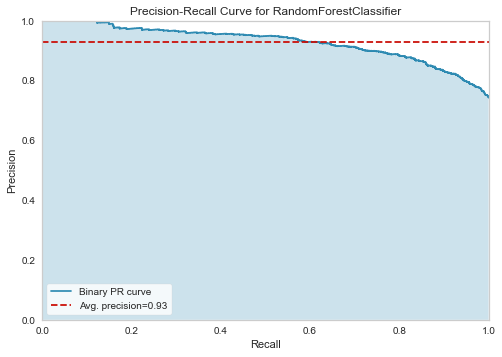

<AxesSubplot:title={'center':'Precision-Recall Curve for RandomForestClassifier'}, xlabel='Recall', ylabel='Precision'>

In [93]:
visualizer=PrecisionRecallCurve(rf,classes=[0,1])

visualizer.fit(X_train,y_train)
visualizer.score(X_test,y_test)
visualizer.show()